In [35]:
import geopandas as gpd
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt
import os
import rioxarray

from levee_hunter.utils import find_splits
from levee_hunter.get_mask import get_mask
from levee_hunter.segmentation_dataset import SegmentationDataset
from levee_hunter.plots import plot_img_and_target


from torch.utils.data import DataLoader
import albumentations as A
import segmentation_models_pytorch as smp
from levee_hunter.plots import infer_and_visualize
import torch
import torch.nn as nn
import torch.optim as optim

In [2]:
# Importing the Lidar data (.tif files)
data_dir = "../data/raw/w3-Lidar"
tif_files = [file for file in os.listdir(data_dir) if file.endswith(".tif")]
tif_files

['USGS_1_n39w122_20240313.tif',
 'USGS_13_n39w122_20240313.tif',
 'USGS_one_meter_x63y422_CA_Sacramento_2017.tif']

In [3]:
img_1m = rioxarray.open_rasterio(os.path.join(data_dir, tif_files[2]))

In [4]:
img_1m.values.shape

(1, 10012, 10012)

In [5]:
print(img_1m.rio.crs)

EPSG:26910


In [6]:
# Load the levees data
levees_file = "../data/raw/w1-Kickoff/us_levees_n38w122.gpkg"
levees_data = gpd.read_file(levees_file)
levees_data_26910 = levees_data.to_crs("EPSG:26910")

In [7]:
# Define augmentations
train_transform = A.Compose(
    [
        A.HorizontalFlip(p=0.5),  # Random horizontal flip
        A.VerticalFlip(p=0.5),  # Random vertical flip
        A.RandomRotate90(p=0.5),  # Random 90-degree rotation
        A.ShiftScaleRotate(
            shift_limit=0.0625, scale_limit=0.1, rotate_limit=15, p=0.5
        ),  # Small shifts, scaling, rotation
        A.ElasticTransform(
            alpha=1, sigma=50, alpha_affine=50, p=0.5
        ),  # Elastic deformation
        A.Normalize(mean=0.0, std=1.0),  # Normalize to 0 mean and 1 std
    ]
)

normalize_only = A.Compose(
    [
        A.Normalize(mean=0.0, std=1.0),  # Normalize to 0 mean and 1 std
    ]
)

/var/folders/tk/2_f29kq533g52jyhs9y4xt000000gn/T/ipykernel_5253/1722272292.py:10: UserWarning: Argument 'alpha_affine' is not valid and will be ignored.
  A.ElasticTransform(


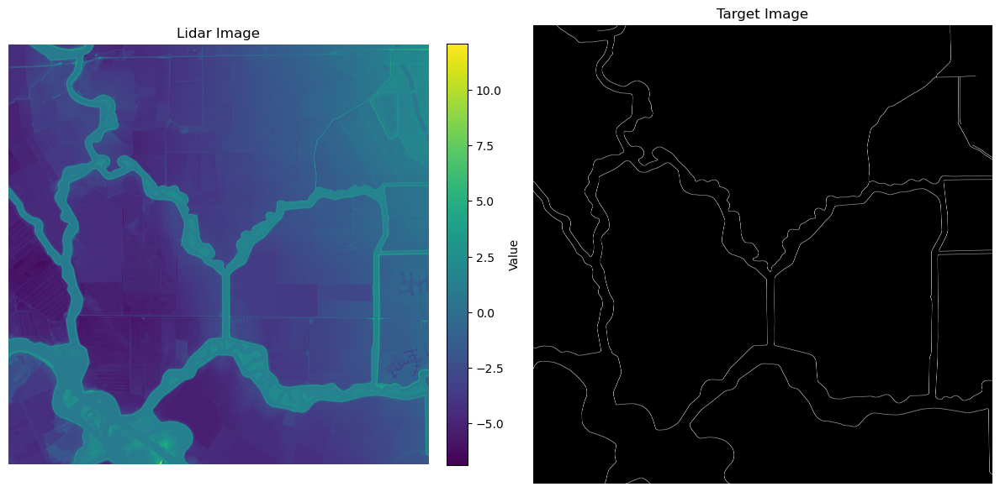

In [8]:
img_1m_arr, img_1m_target = get_mask(
    img_1m, levees_data_26910, invert=True, dilation_size=7
)

plot_img_and_target(img_1m_arr, img_1m_target)

In [9]:
img_1m_target = img_1m_target.reshape(1, 10012, 10012)
img_1m_arr.shape, img_1m_target.shape

((1, 10012, 10012), (1, 10012, 10012))

In [10]:
find_splits(Z=10012, s=512, max_overlap_frac=0.1)[:5]

[(20, 12, 10012),
 (21, 37, 10012),
 (20, 13, 9993),
 (21, 38, 9992),
 (20, 14, 9974)]

In [11]:
img_1m_dataset_512 = SegmentationDataset(
    img_1m_arr[:, :10012, :10012],
    img_1m_target[:, :10012, :10012],
    transform=train_transform,
    split=True,
    patch_size=512,
    final_size=512,
    overlap=12,
)

len(img_1m_dataset_512)

400

In [12]:
img_1m_dataset_512.remove_empty(keep_empty=0.3)
len(img_1m_dataset_512)

218

0


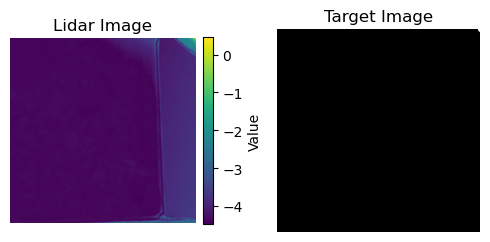

1


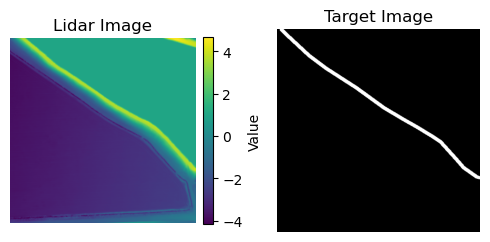

2


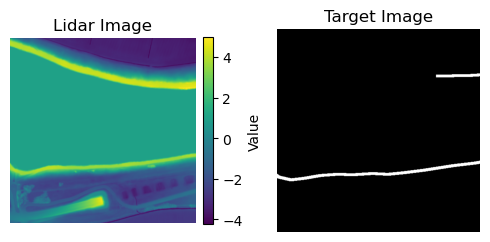

3


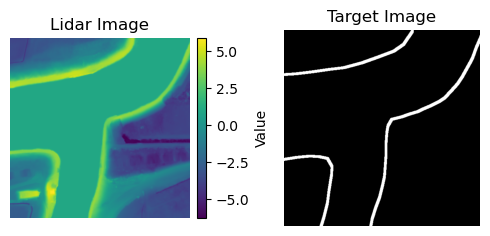

4


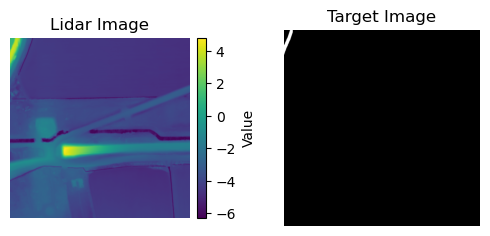

5


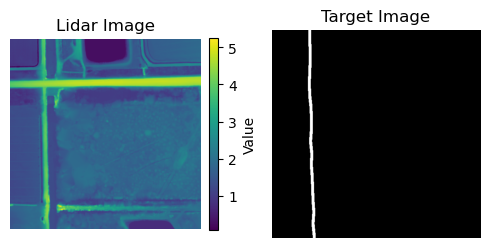

6


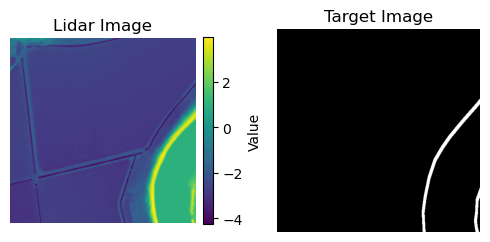

7


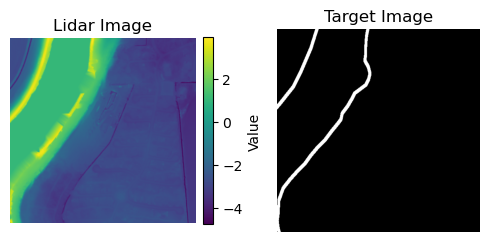

8


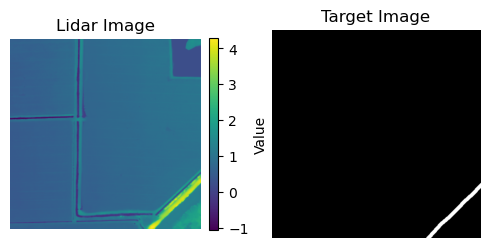

9


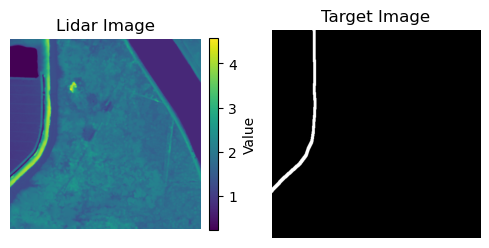

10


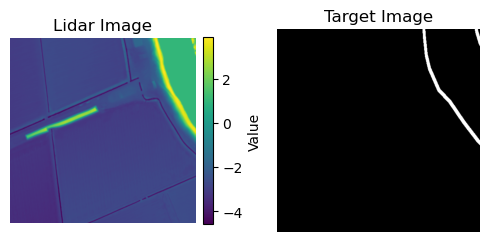

11


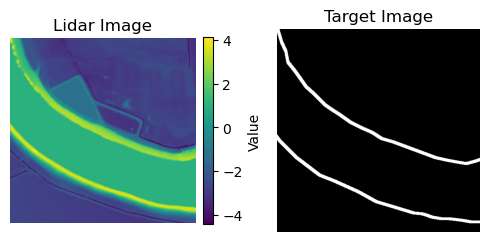

12


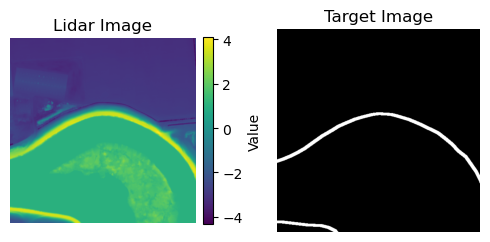

13


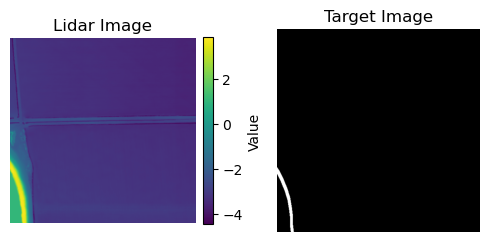

14


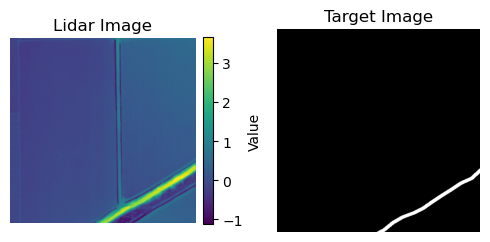

15


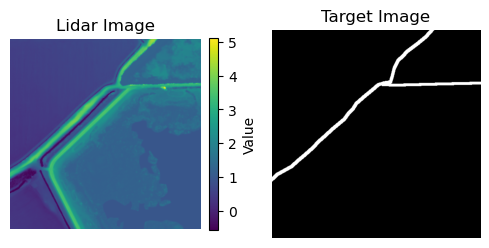

16


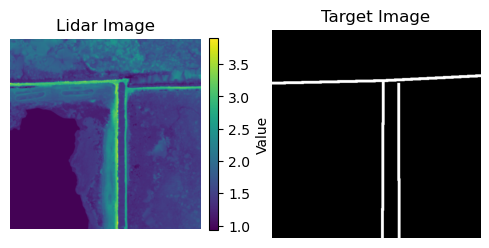

17


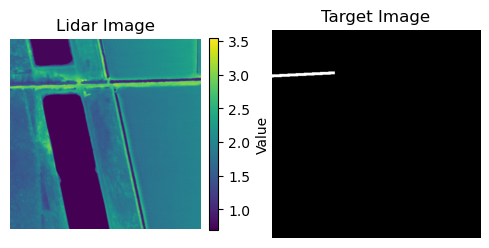

18


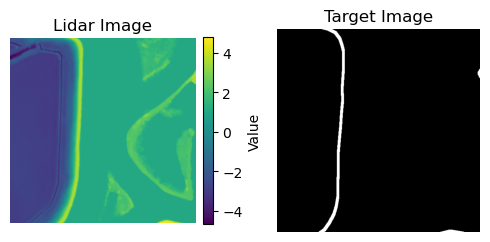

19


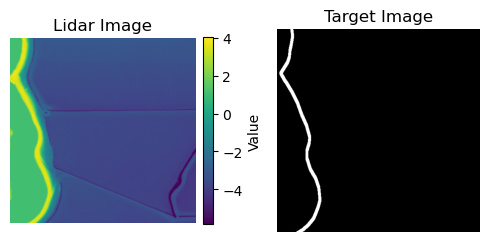

20


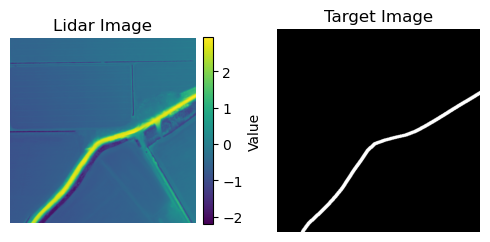

21


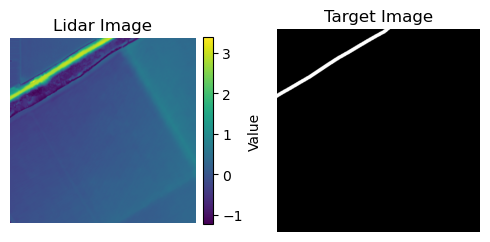

22


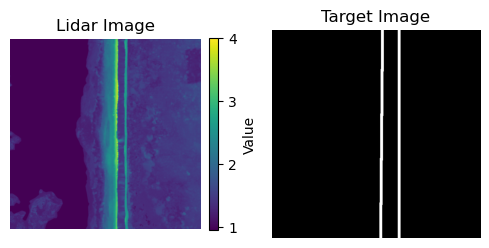

23


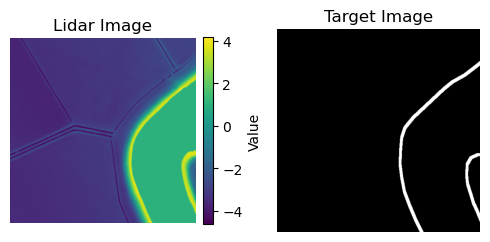

24


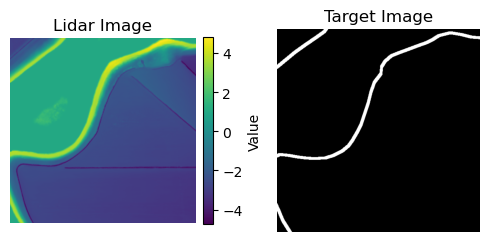

25


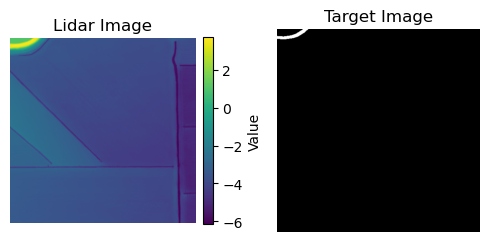

26


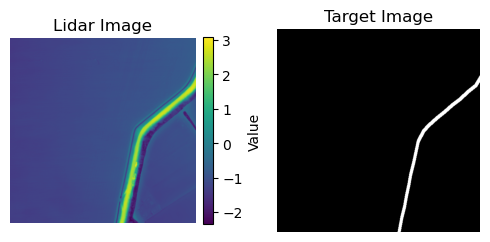

27


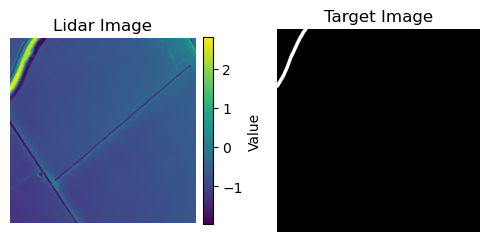

28


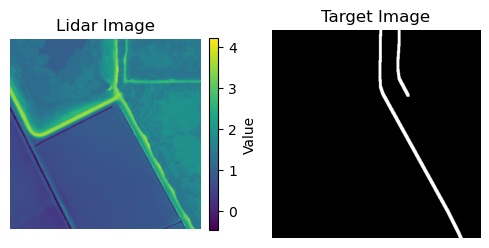

29


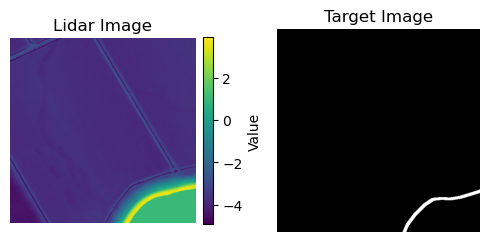

30


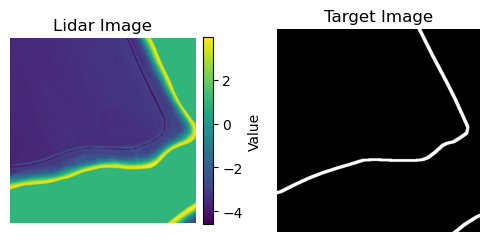

31


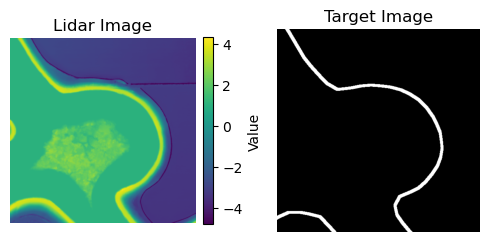

32


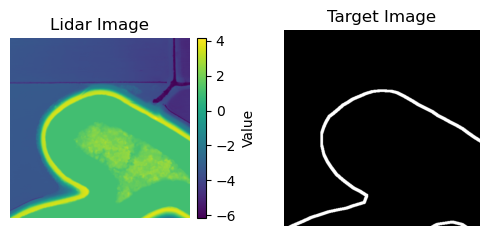

33


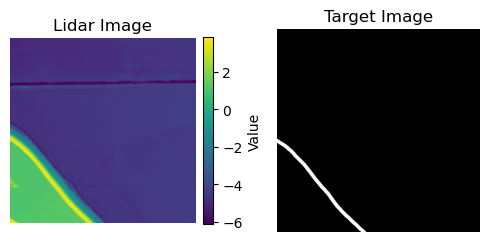

34


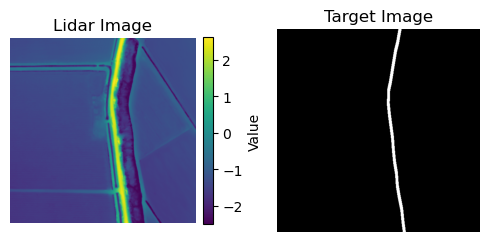

35


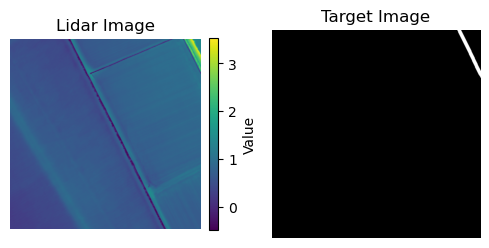

36


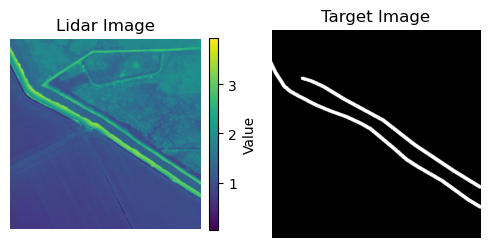

37


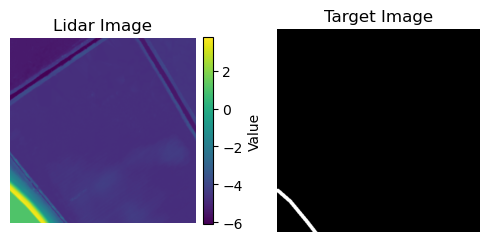

38


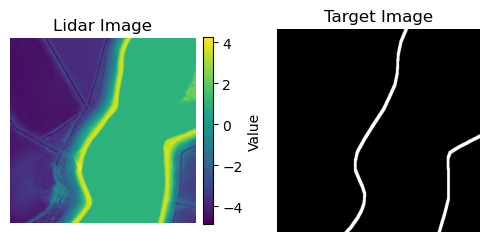

39


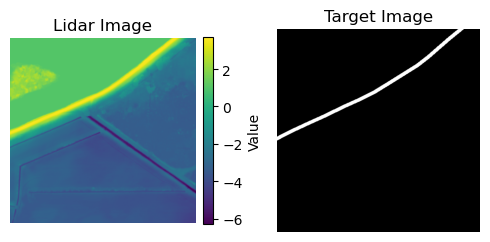

40


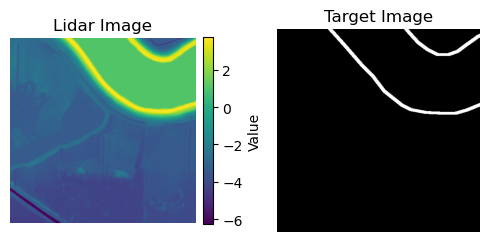

41


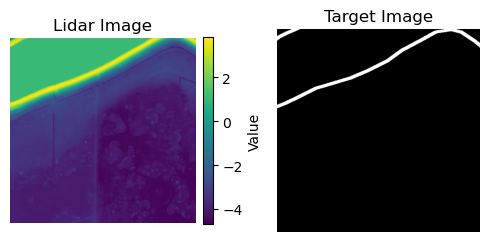

42


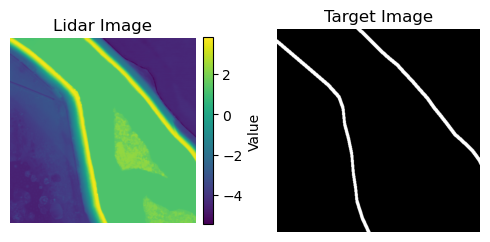

43


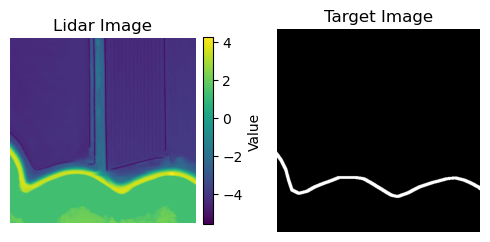

44


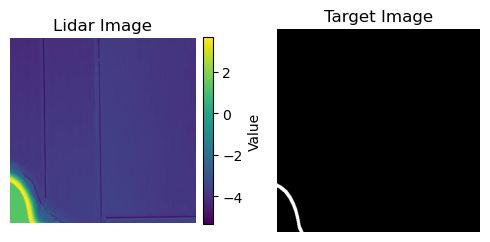

45


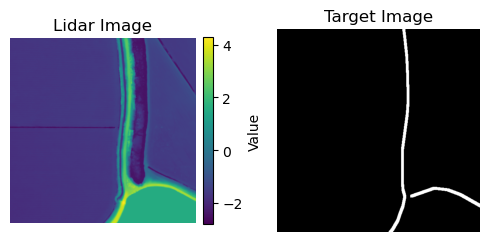

46


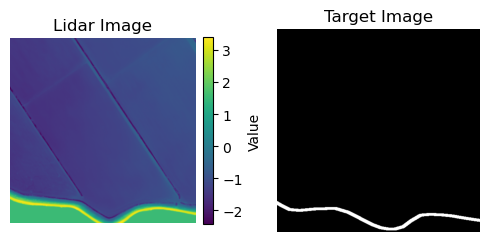

47


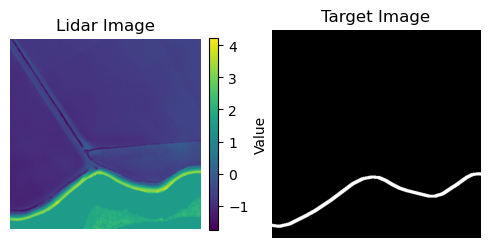

48


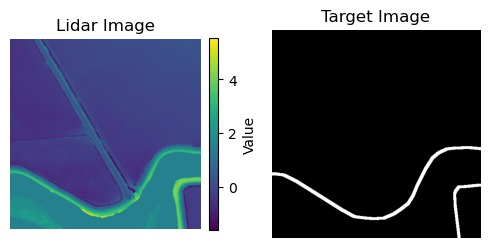

49


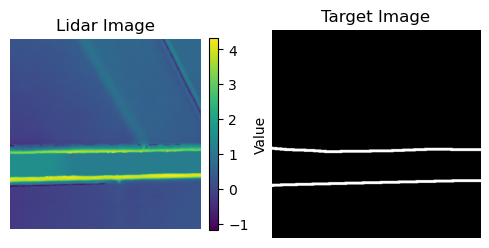

50


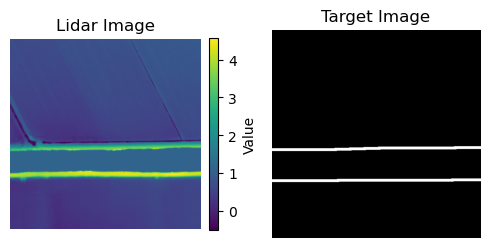

51


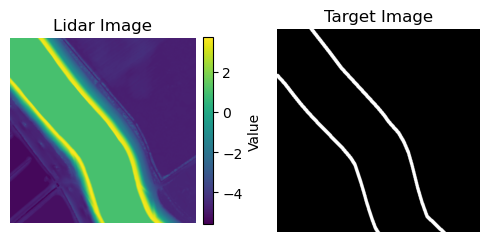

52


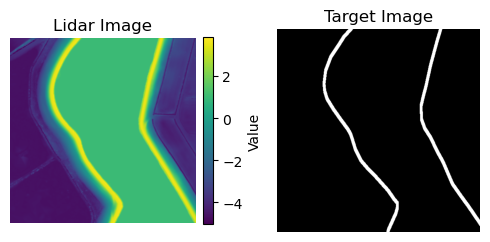

53


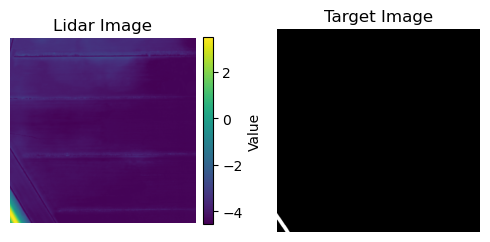

54


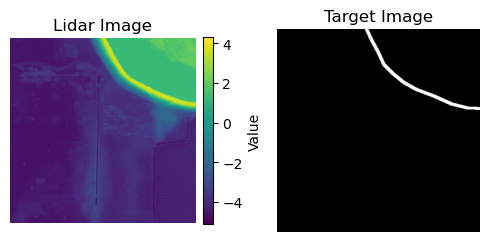

55


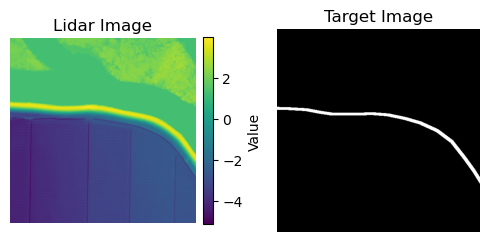

56


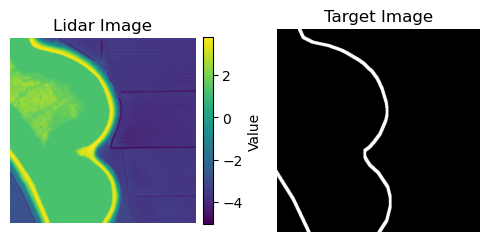

57


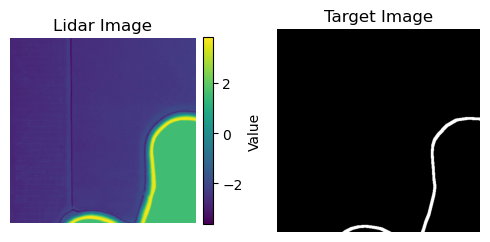

58


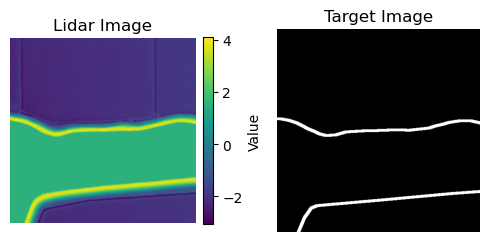

59


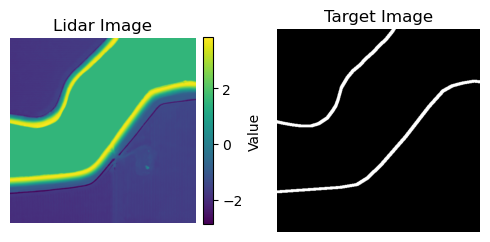

60


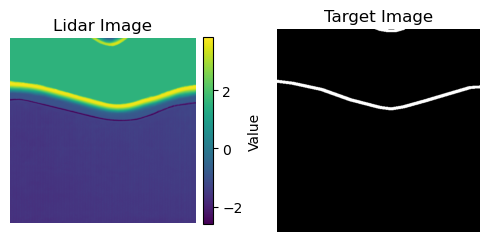

61


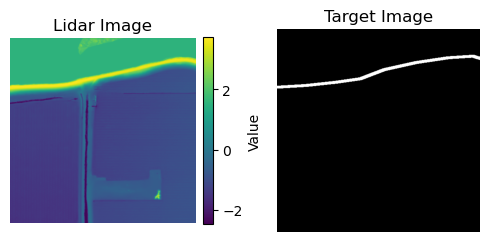

62


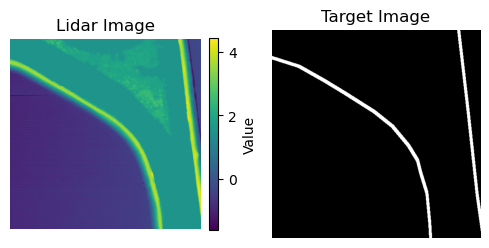

63


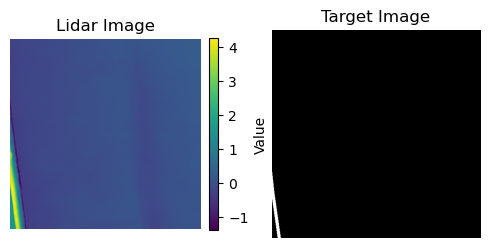

64


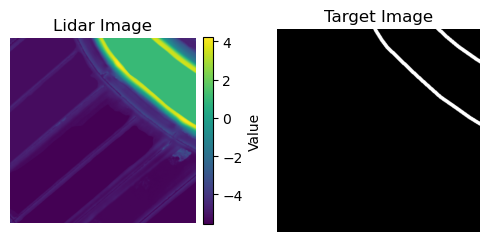

65


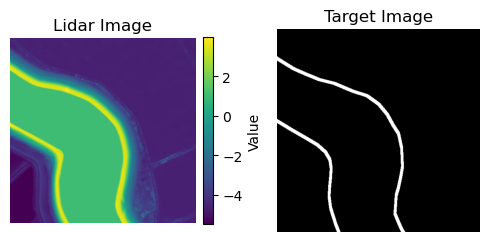

66


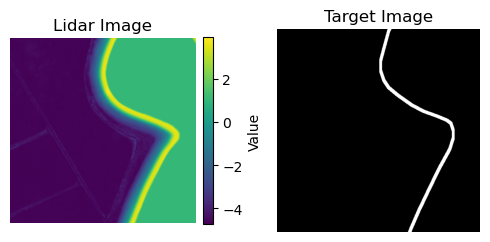

67


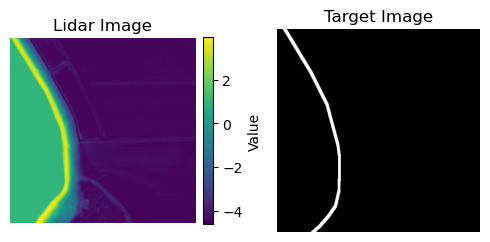

68


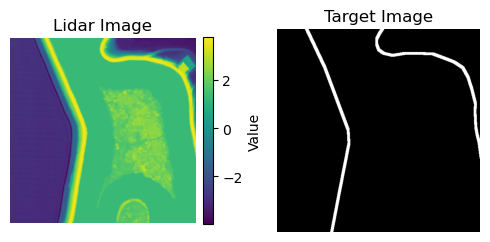

69


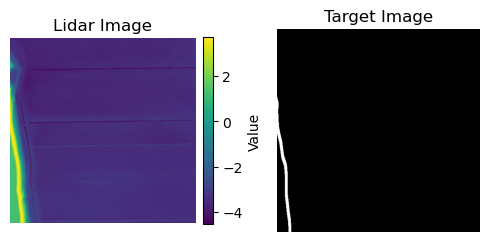

70


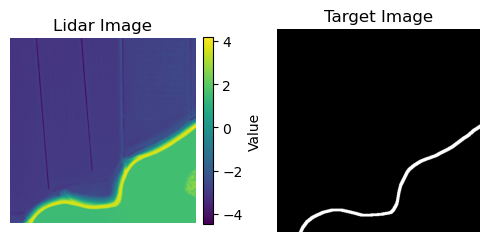

71


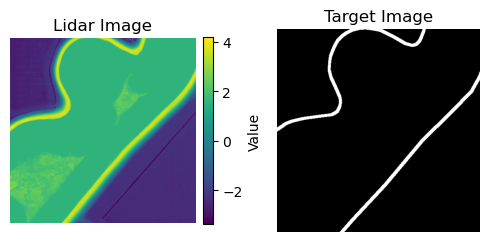

72


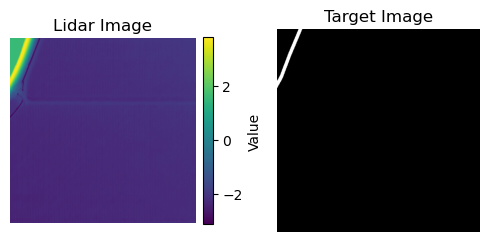

73


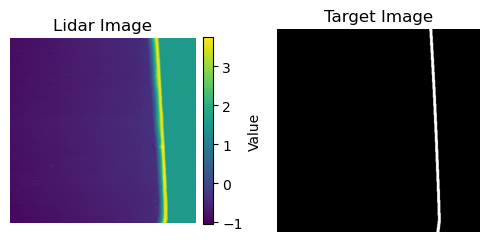

74


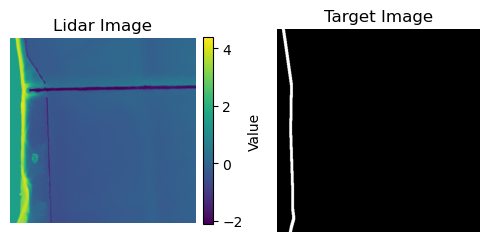

75


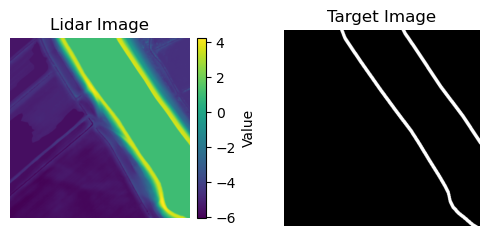

76


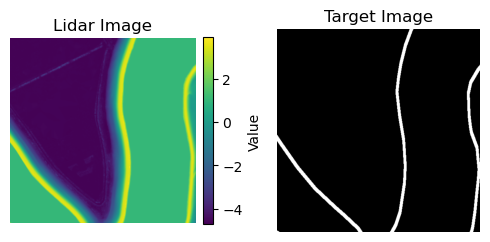

77


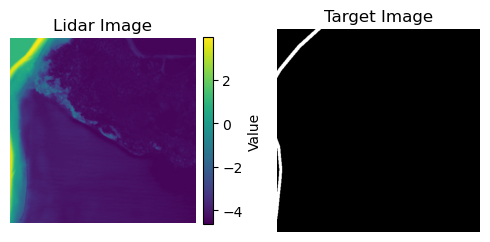

78


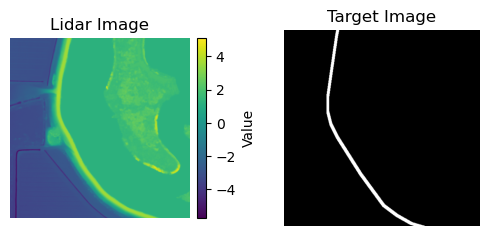

79


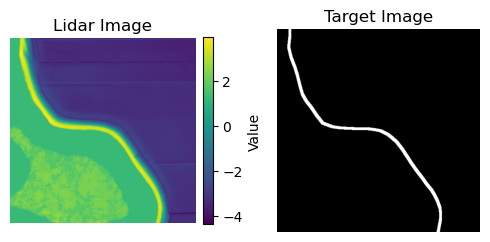

80


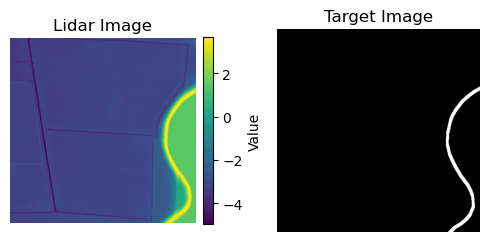

81


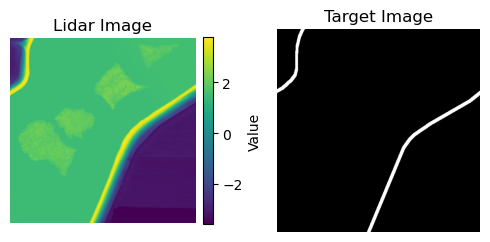

82


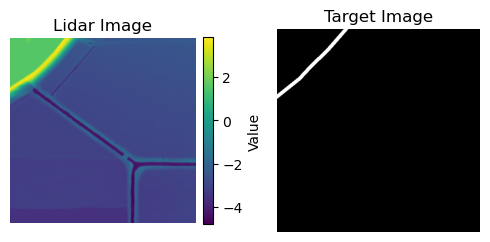

83


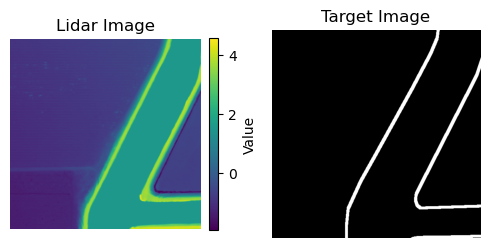

84


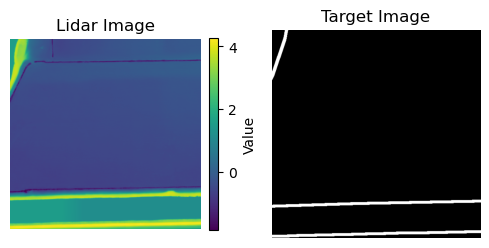

85


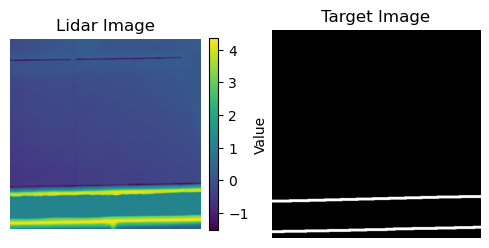

86


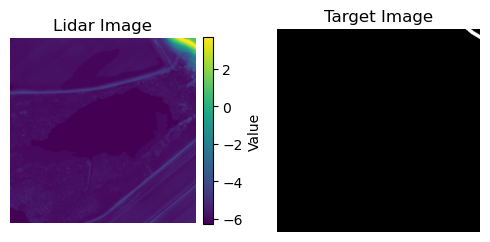

87


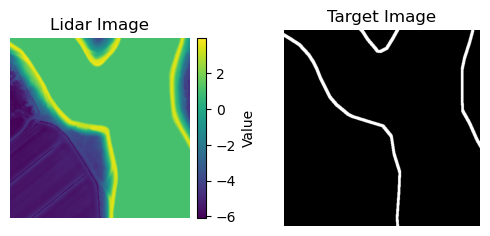

88


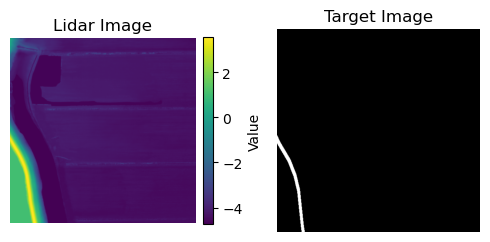

89


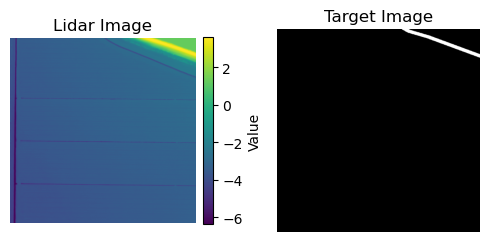

90


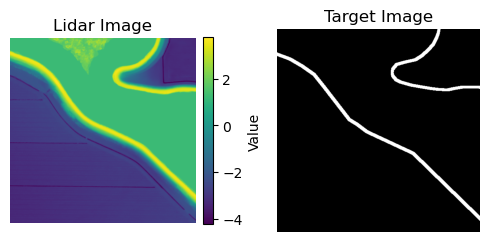

91


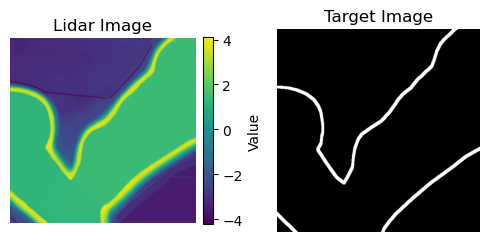

92


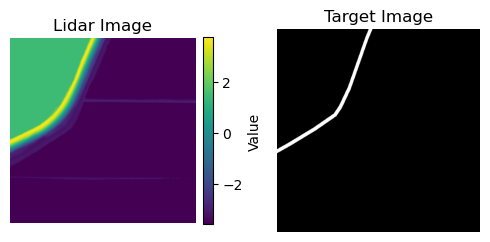

93


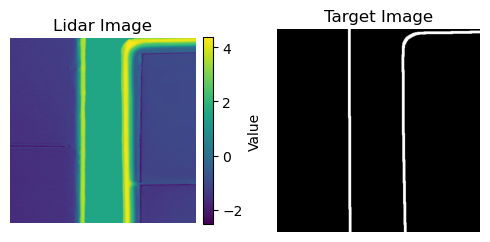

94


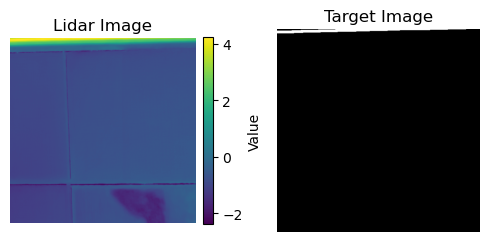

95


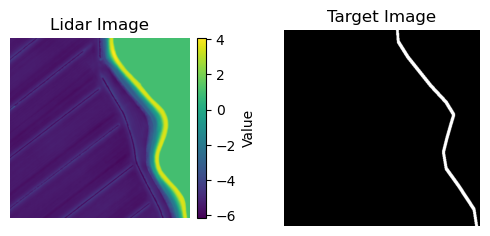

96


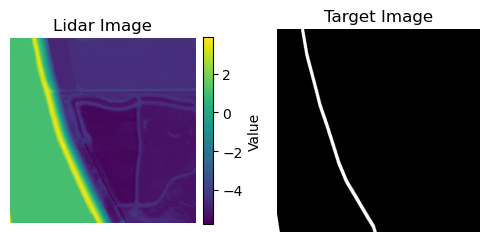

97


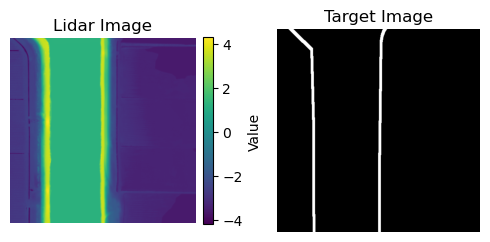

98


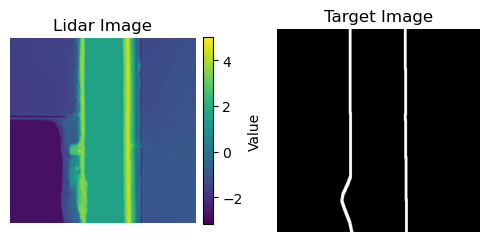

99


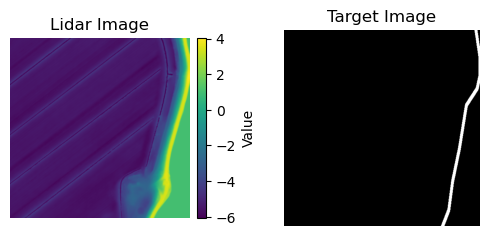

100


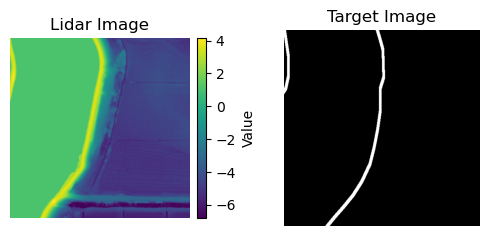

101


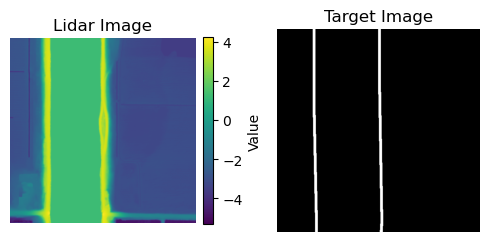

102


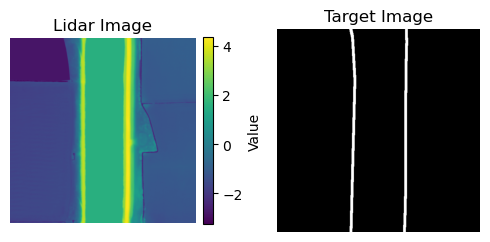

103


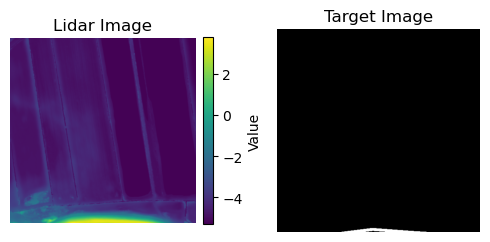

104


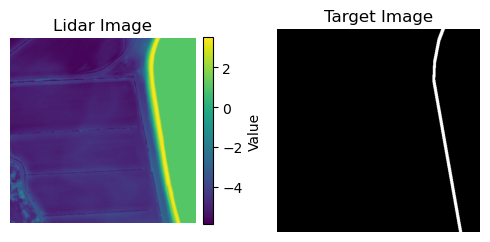

105


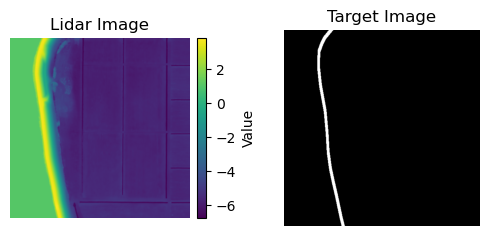

106


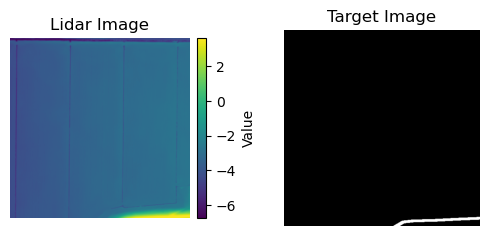

107


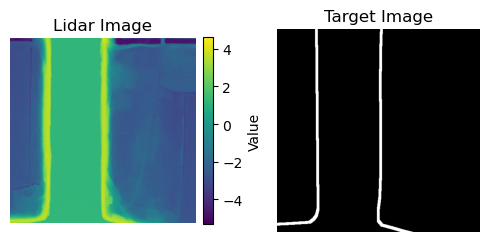

108


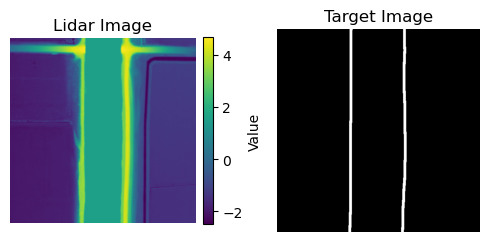

109


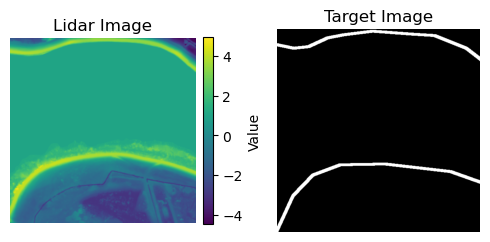

110


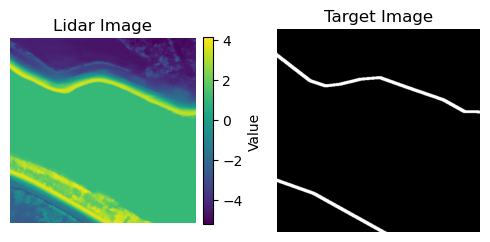

111


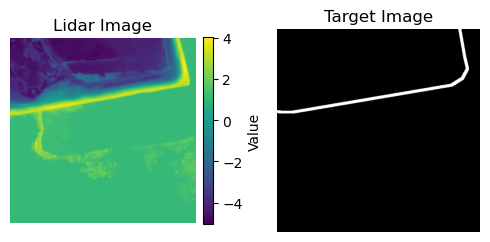

112


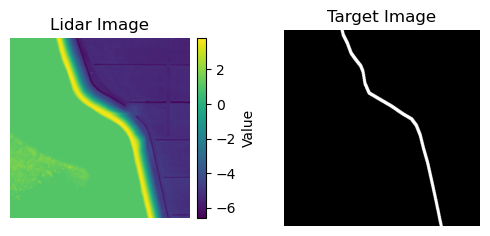

113


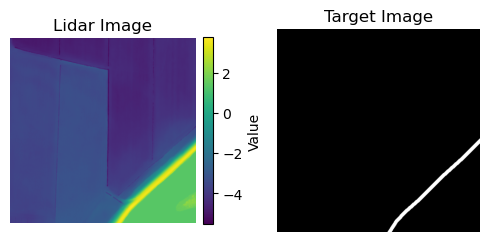

114


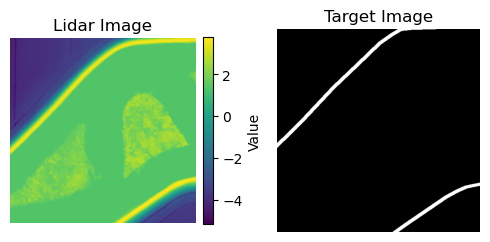

115


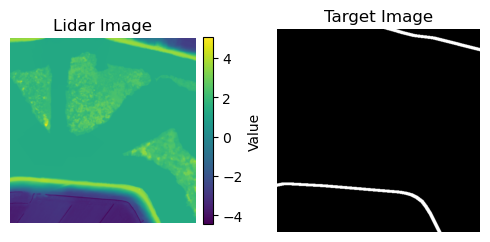

116


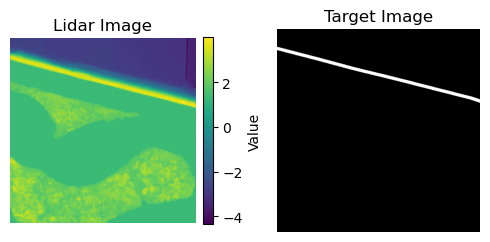

117


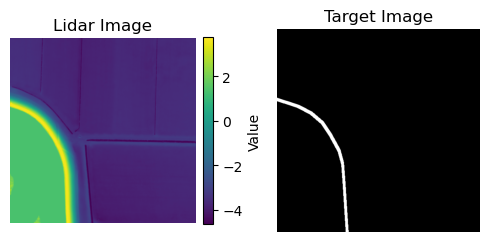

118


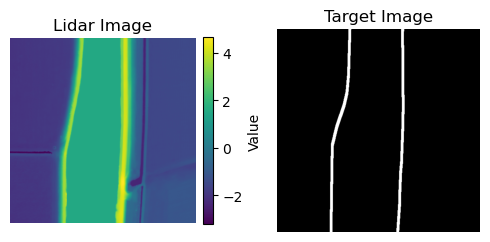

119


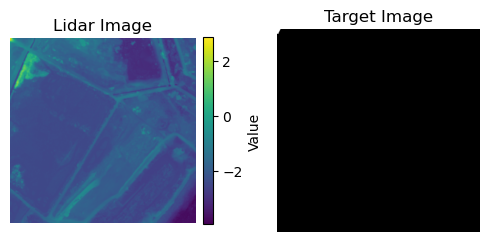

120


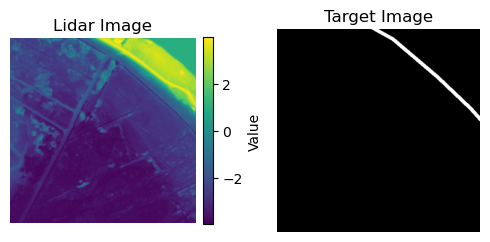

121


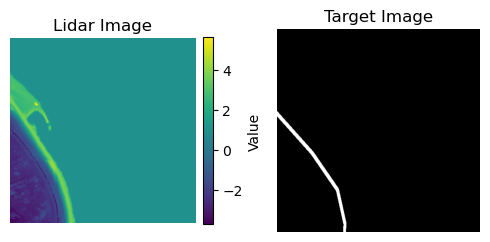

122


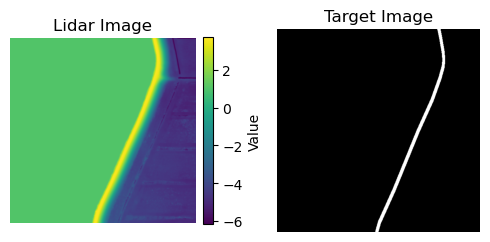

123


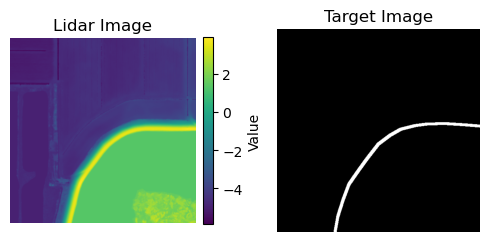

124


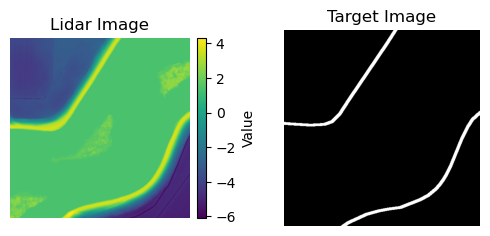

125


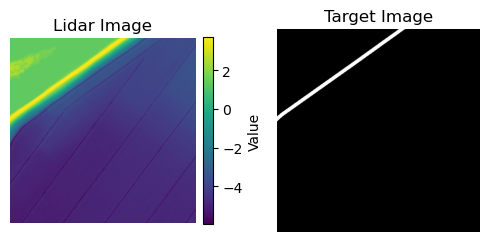

126


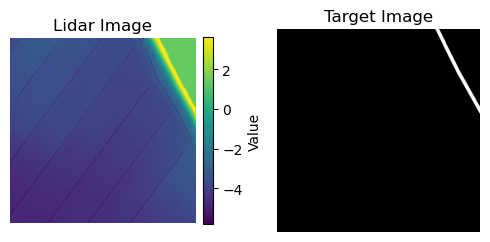

127


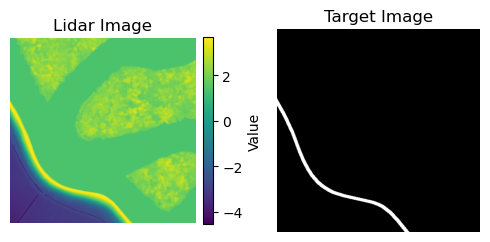

128


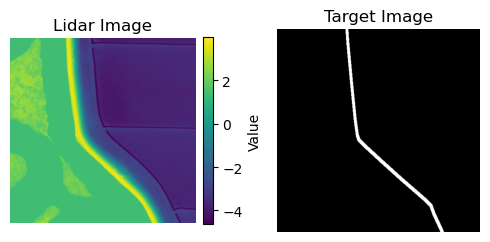

129


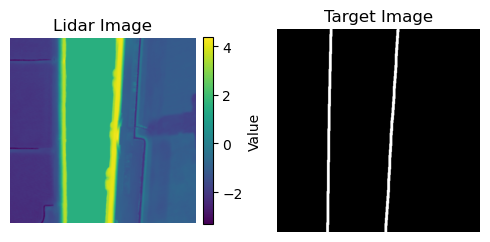

130


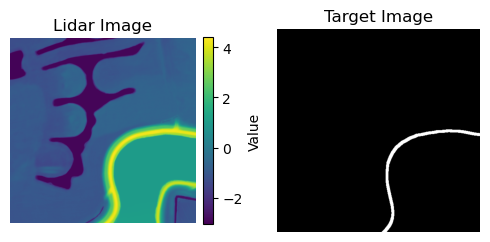

131


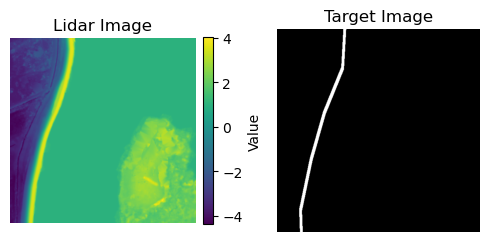

132


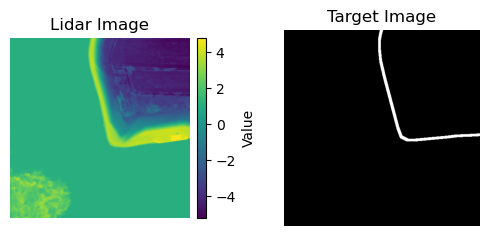

133


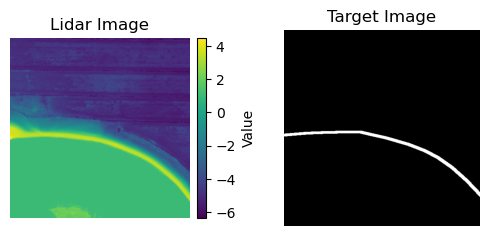

134


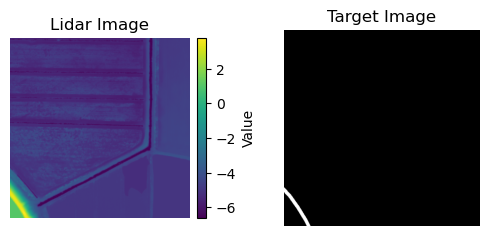

135


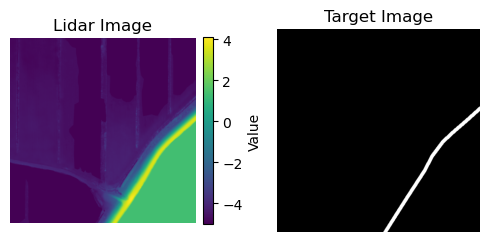

136


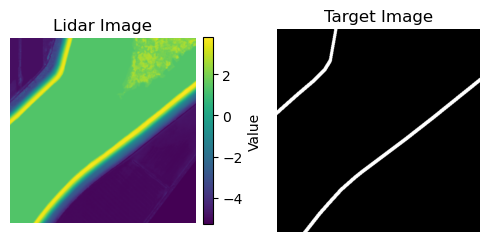

137


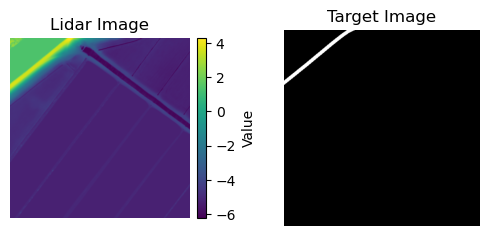

138


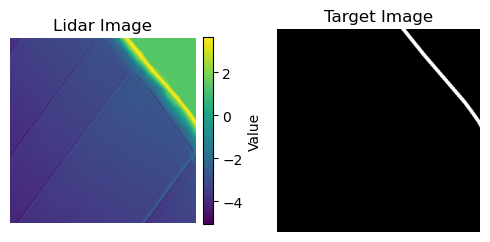

139


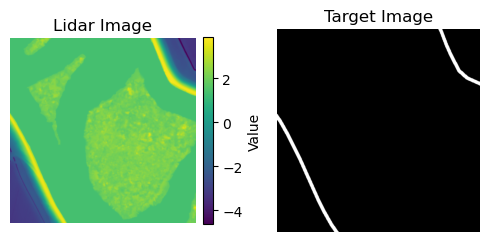

140


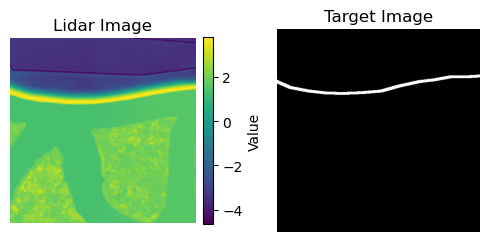

141


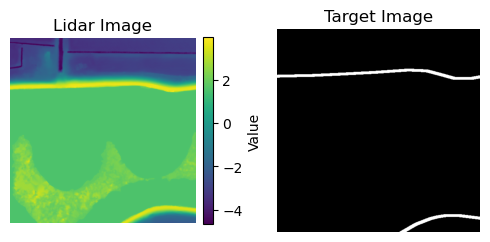

142


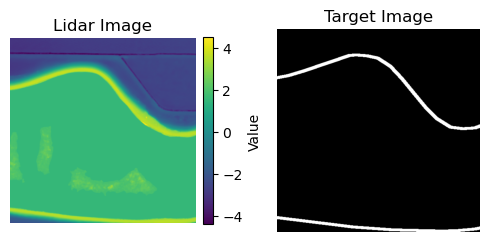

143


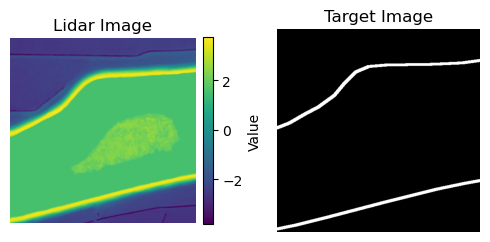

144


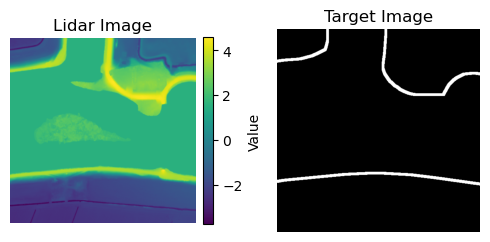

145


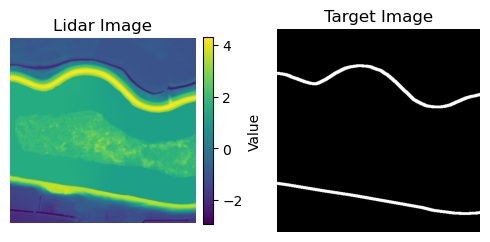

146


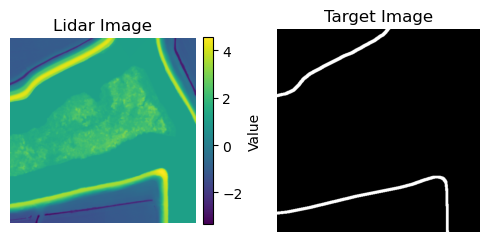

147


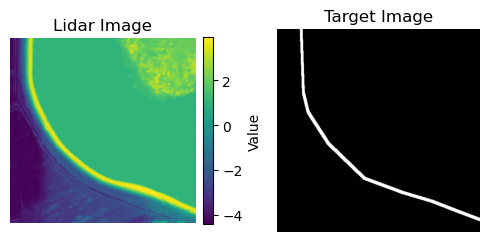

148


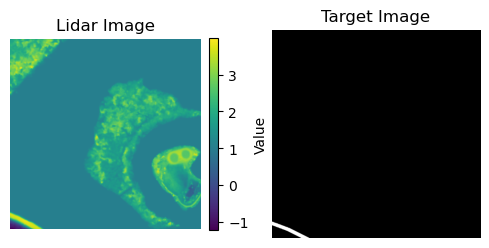

149


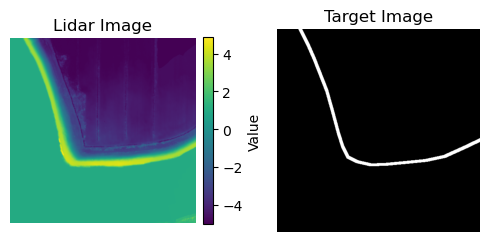

150


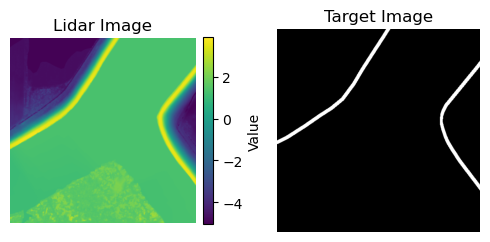

151


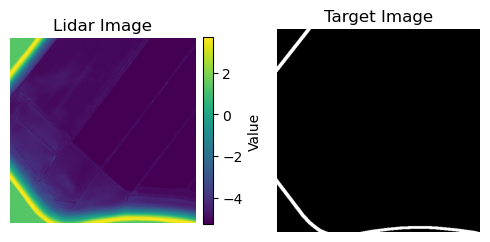

152


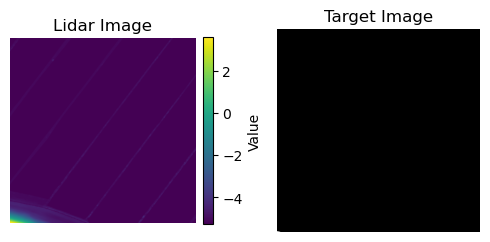

153


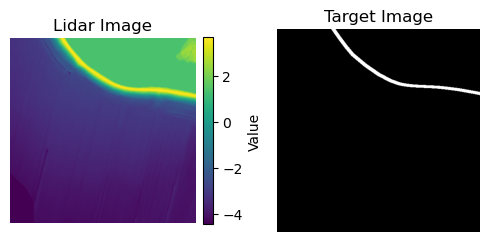

154


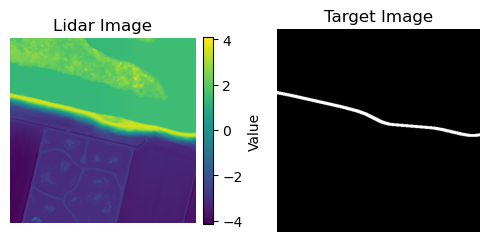

155


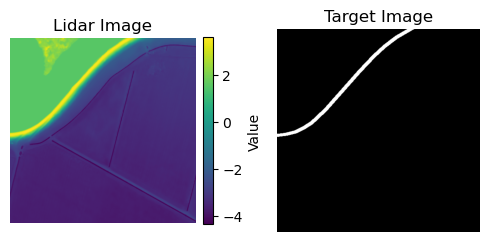

156


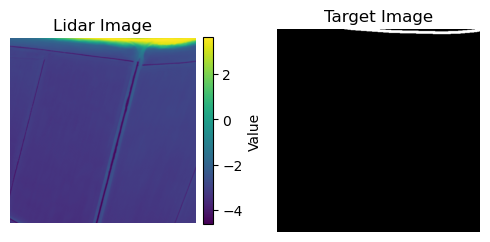

157


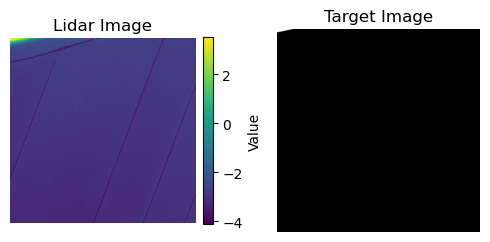

158


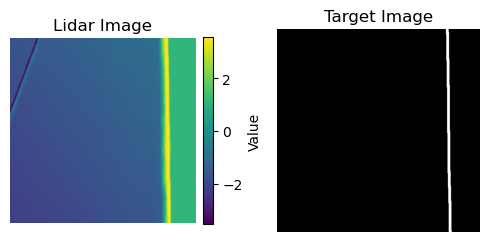

159


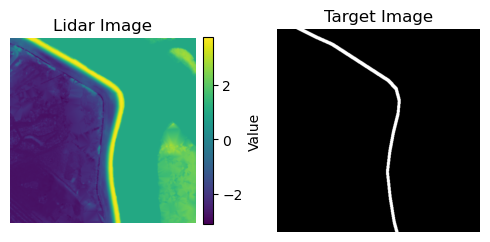

160


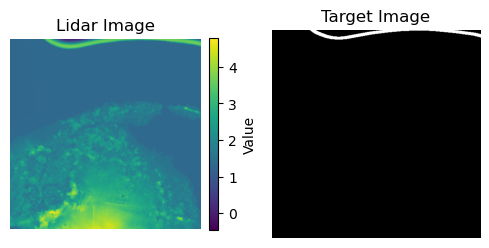

161


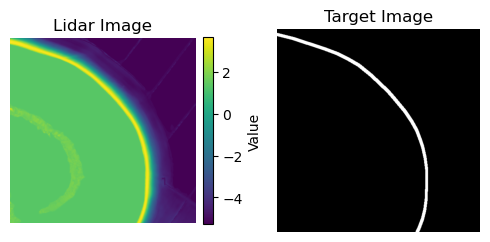

162


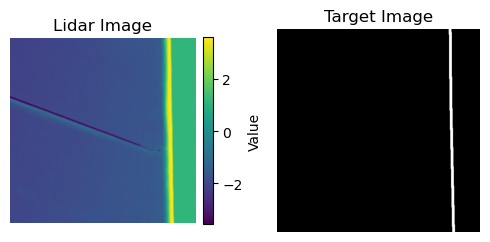

163


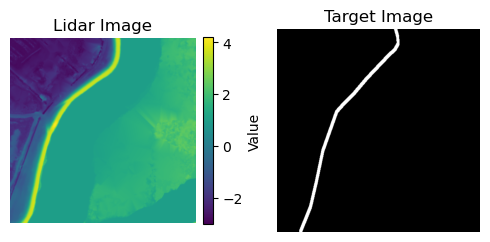

164


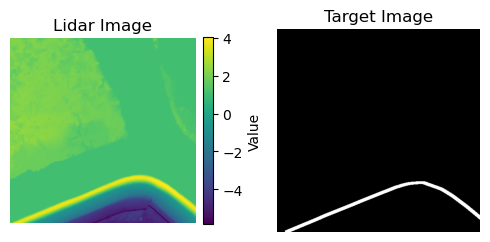

165


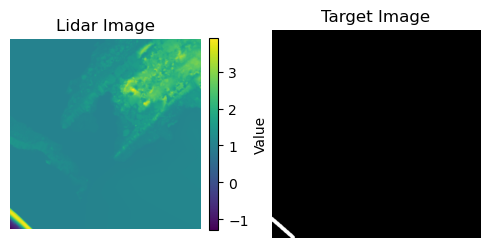

166


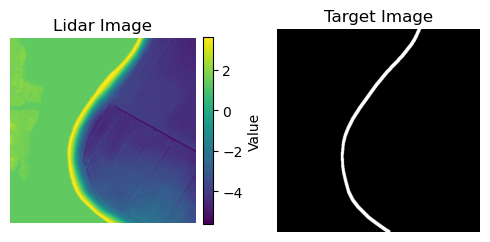

167


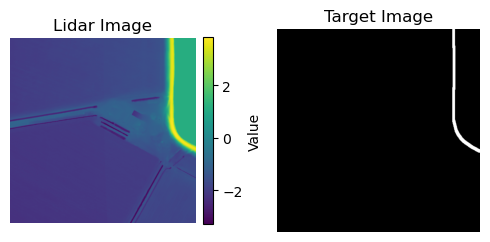

168


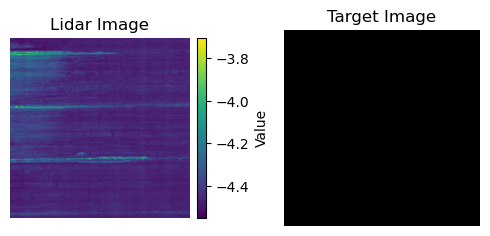

169


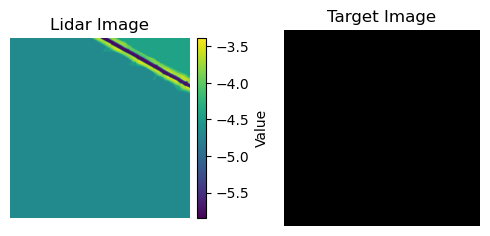

170


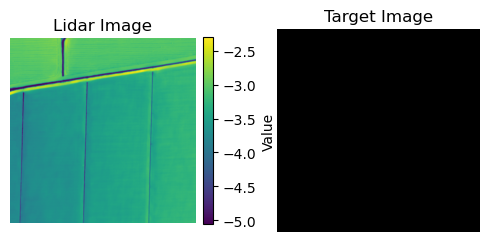

171


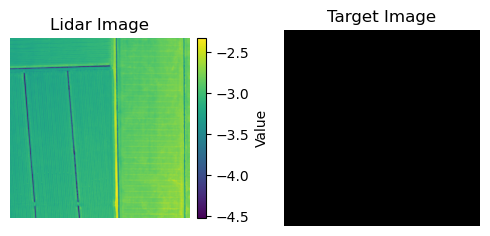

172


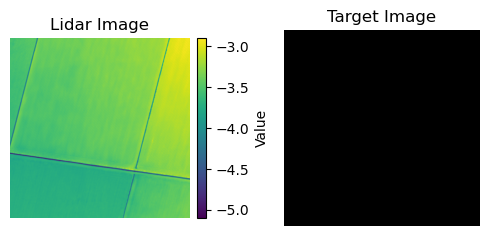

173


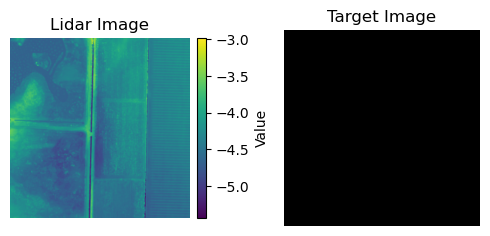

174


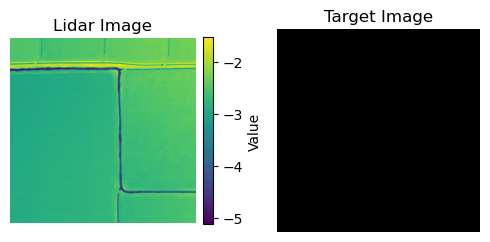

175


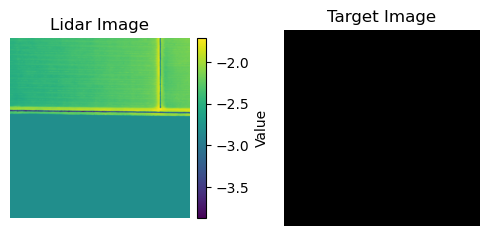

176


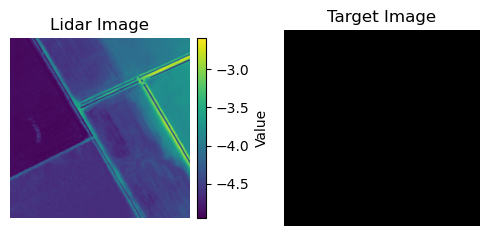

177


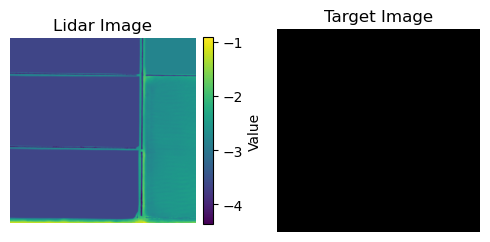

178


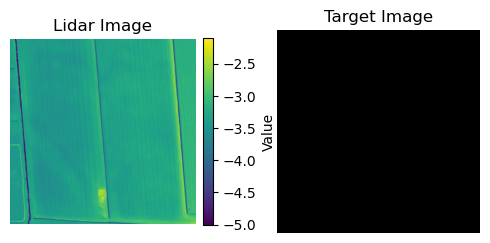

179


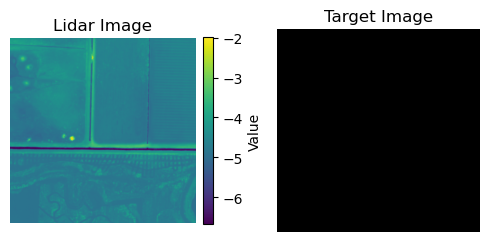

180


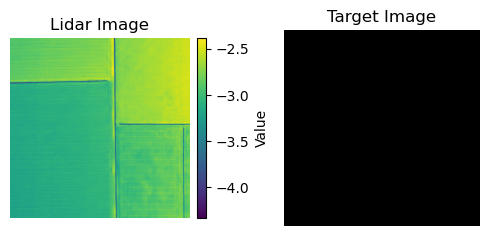

181


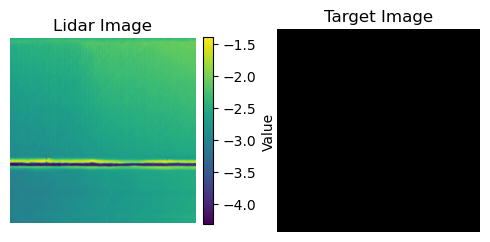

182


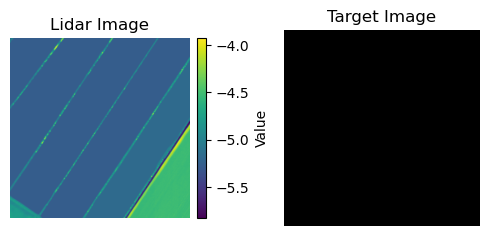

183


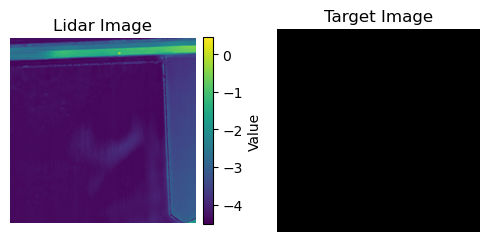

184


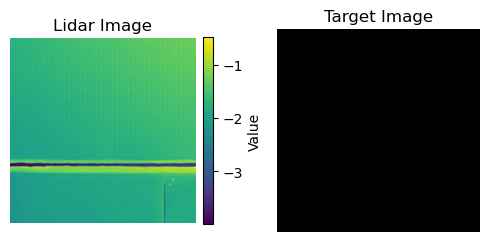

185


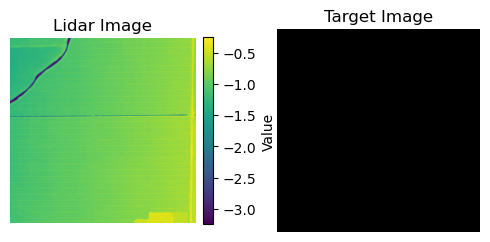

186


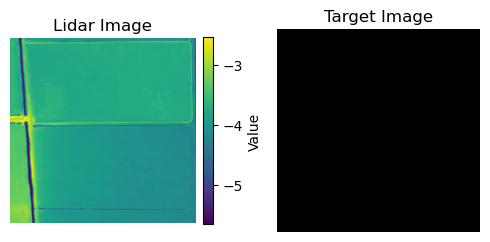

187


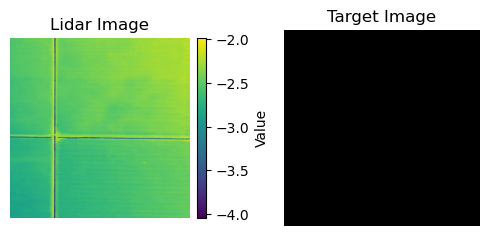

188


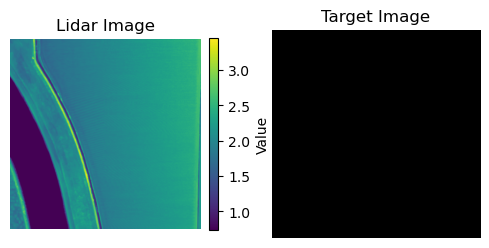

189


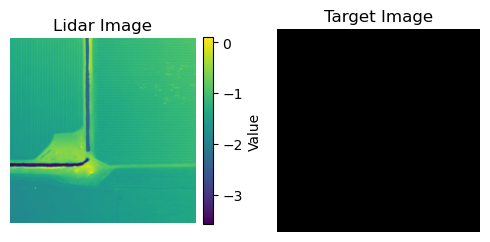

190


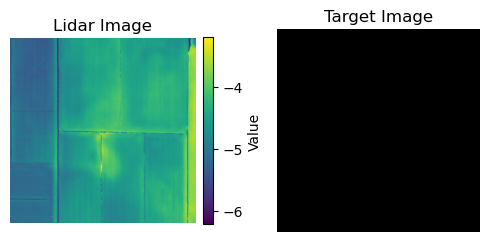

191


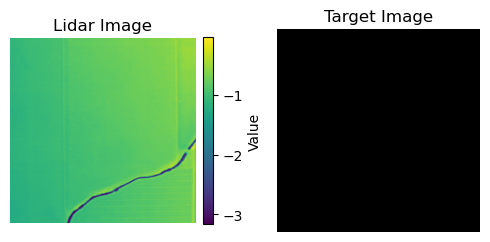

192


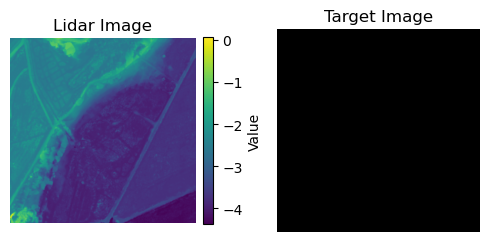

193


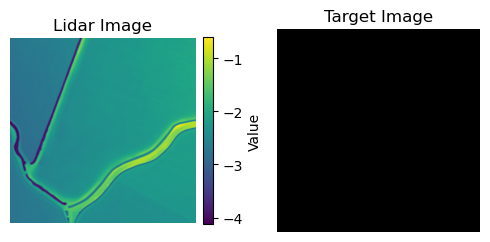

194


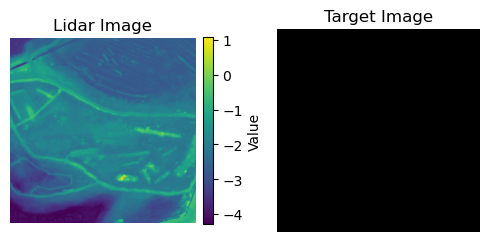

195


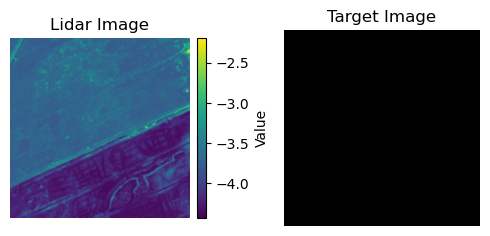

196


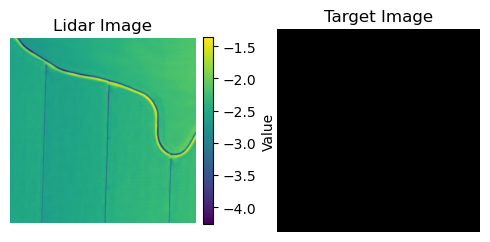

197


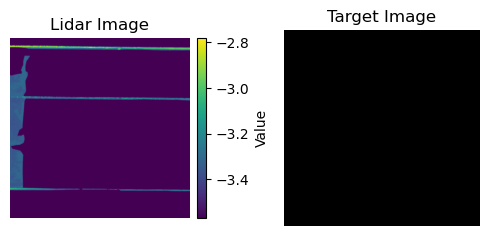

198


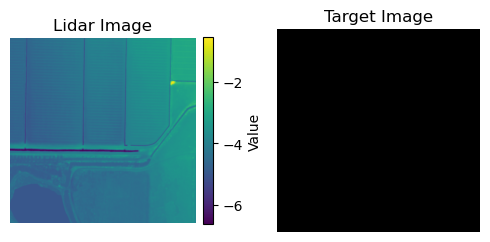

199


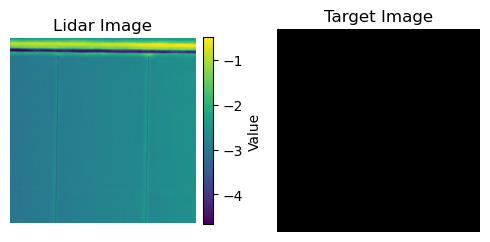

200


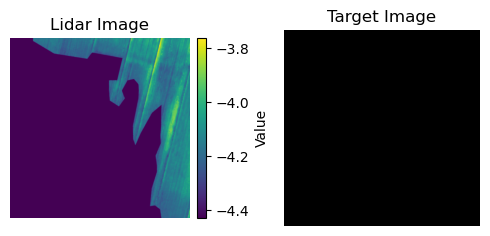

201


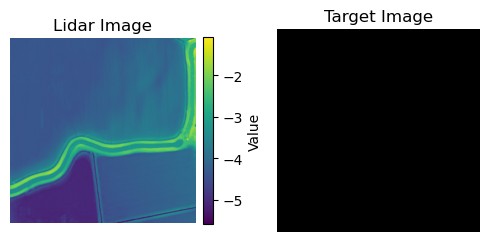

202


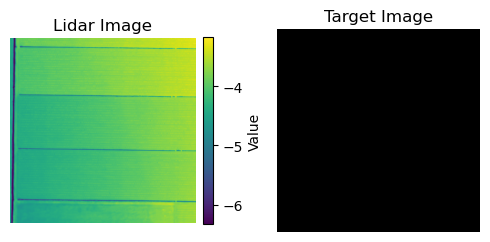

203


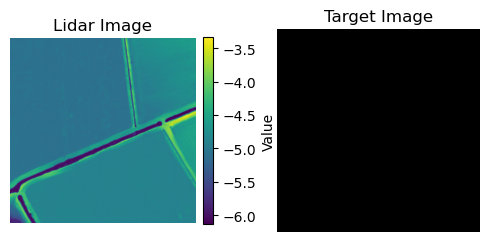

204


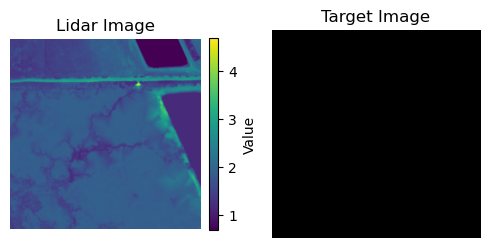

205


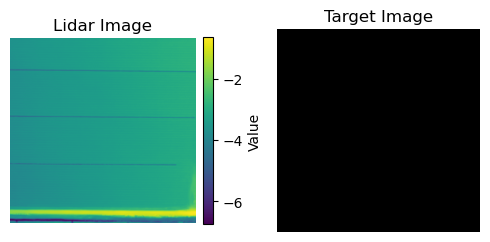

206


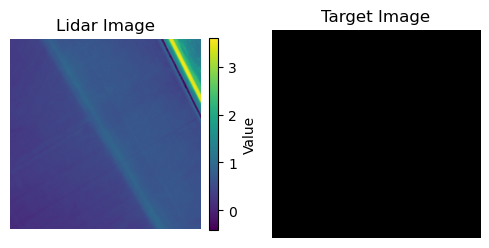

207


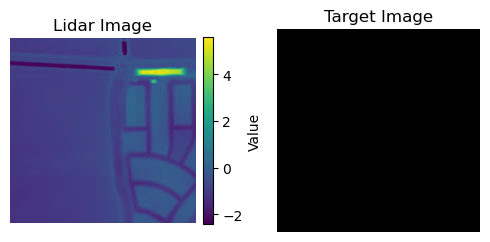

208


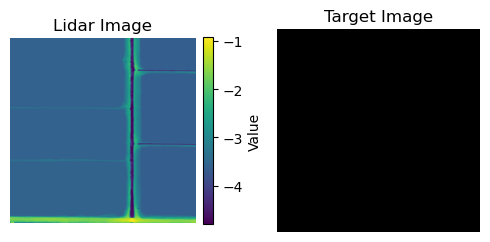

209


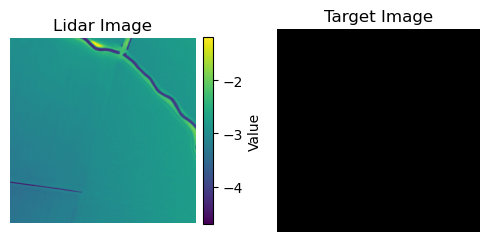

210


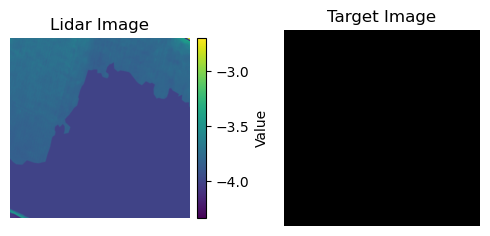

211


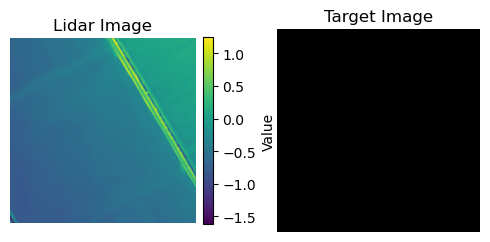

212


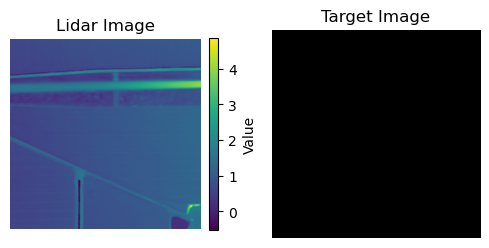

213


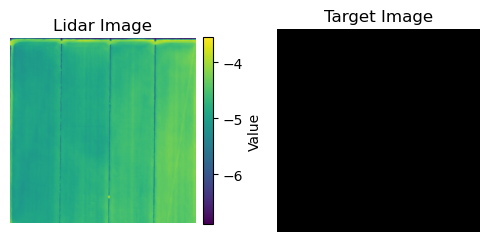

214


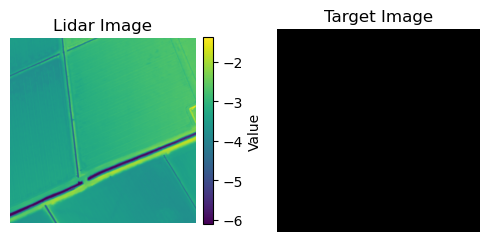

215


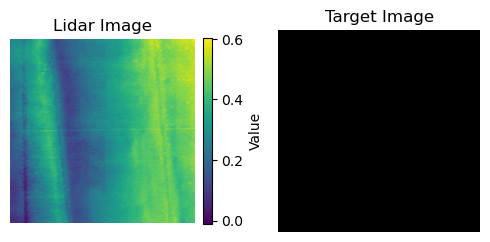

216


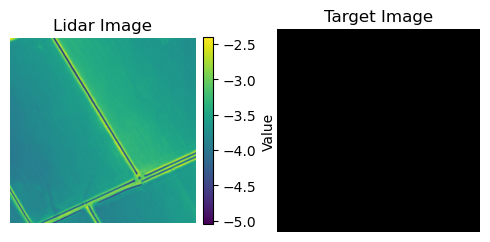

217


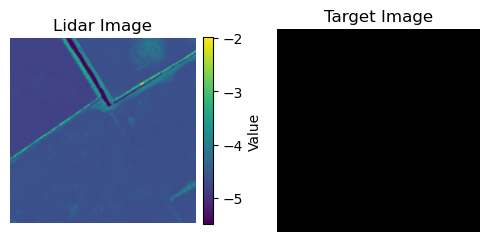

In [13]:
for ix in range(len(img_1m_dataset_512)):
    print(ix)
    img_1m_dataset_512.plot(ix, figsize=(5, 5))

In [18]:
img_1m_dataset_512.to_array()
img_1m_dataset_512.images.shape, img_1m_dataset_512.targets.shape

((218, 1, 512, 512), (218, 1, 512, 512))

In [24]:
good_ix = [
    3,
    6,
    7,
    8,
    9,
    10,
    11,
    12,
    13,
    14,
    16,
    18,
    19,
    20,
    21,
    22,
    23,
    24,
    25,
    26,
    27,
    29,
    30,
    31,
    32,
    33,
    34,
    35,
    37,
    38,
    39,
    40,
    41,
    42,
    43,
    44,
    45,
    46,
    47,
    48,
    49,
    50,
    51,
    52,
    53,
    54,
    55,
    56,
    57,
    58,
    59,
    60,
    61,
    62,
    63,
    64,
    65,
    66,
    67,
    68,
    69,
    70,
    71,
    72,
    73,
    74,
    75,
    76,
    77,
    78,
    79,
    80,
    81,
    82,
    83,
    84,
    85,
    86,
    87,
    88,
    89,
    90,
    91,
    92,
    93,
    94,
    95,
    96,
    97,
    98,
    99,
    100,
    101,
    102,
    103,
    104,
    105,
    106,
    107,
    108,
    109,
    110,
    111,
    112,
    113,
    114,
    115,
    116,
    117,
    118,
    119,
    120,
    121,
    122,
    123,
    124,
    125,
    126,
    127,
    128,
    129,
    130,
    131,
    132,
    133,
    134,
    135,
    136,
    137,
    138,
    139,
    140,
    141,
    142,
    143,
    144,
    145,
    146,
    147,
    148,
    149,
    150,
    151,
    152,
    153,
    154,
    155,
    156,
    157,
    158,
    159,
    160,
    161,
    162,
    163,
    164,
    165,
    166,
    167,
    168,
    172,
    180,
    185,
    190,
    191,
    192,
    195,
    198,
    200,
    202,
    207,
    209,
    210,
    213,
    215,
    217,
]

In [26]:
good_images = img_1m_dataset_512.images[good_ix]
good_targets = img_1m_dataset_512.targets[good_ix]


good_images.shape, good_targets.shape

((176, 1, 512, 512), (176, 1, 512, 512))

In [28]:
from sklearn.model_selection import train_test_split
import numpy as np

# Define the split ratio
test_size = 0.2  # 20% for testing/validation

# Generate shuffled indices
indices = np.arange(len(good_images))

# Split into training and validation sets
train_idx, val_idx = train_test_split(
    indices, test_size=test_size, random_state=42, shuffle=True
)

# Select corresponding images and targets
train_images, val_images = good_images[train_idx], good_images[val_idx]
train_targets, val_targets = good_targets[train_idx], good_targets[val_idx]

# Print shapes to verify
print(train_images.shape, val_images.shape)
print(train_targets.shape, val_targets.shape)

(140, 1, 512, 512) (36, 1, 512, 512)
(140, 1, 512, 512) (36, 1, 512, 512)


In [29]:
training_dataset = SegmentationDataset(
    images=train_images,
    targets=train_targets,
    transform=train_transform,
    split=False,
)

len(training_dataset)

140

In [31]:
val_dataset = SegmentationDataset(
    images=val_images, targets=val_targets, transform=normalize_only, split=False
)

len(val_dataset)

36

# Data Loader and Batch Size

In [33]:
batch_size = 16
device = "cuda" if torch.cuda.is_available() else "cpu"

train_loader = DataLoader(training_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=len(val_dataset), shuffle=False)

In [34]:
train_loader.dataset.images[0].shape

(1, 512, 512)

# Model

In [36]:
model = smp.Unet(
    encoder_name="resnet34", encoder_weights="imagenet", in_channels=1, classes=1
).to(device)

criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

In [37]:
best_loss = float("inf")
epochs = 17

train_loss_list = []
val_loss_list = []

for epoch in range(epochs):
    model.train()
    train_loss = 0.0

    for images, mask in train_loader:
        images, mask = images.to(device), mask.to(device)
        optimizer.zero_grad()
        output = model(images)
        loss = criterion(output, mask)
        loss.backward()
        optimizer.step()
        train_loss += loss.item()

    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for images, mask in val_loader:
            images, mask = images.to(device), mask.to(device)
            output = model(images)
            loss = criterion(output, mask)
            val_loss += loss.item()

    train_loss = train_loss / len(train_loader)
    val_loss = val_loss / len(val_loader)

    train_loss_list.append(train_loss)
    val_loss_list.append(val_loss)

    print(f"Epoch: {epoch+1}/{epochs} Train Loss: {train_loss} Val Loss: {val_loss}")

Epoch: 1/17 Train Loss: 0.6841656002733443 Val Loss: 0.40321072936058044
Epoch: 2/17 Train Loss: 0.38095347748862374 Val Loss: 0.5324192643165588
Epoch: 3/17 Train Loss: 0.29366640249888104 Val Loss: 0.20945709943771362
Epoch: 4/17 Train Loss: 0.24487318760818905 Val Loss: 0.1796388030052185
Epoch: 5/17 Train Loss: 0.20771029757128823 Val Loss: 0.147810697555542
Epoch: 6/17 Train Loss: 0.17631764378812578 Val Loss: 0.13251334428787231
Epoch: 7/17 Train Loss: 0.15332133405738407 Val Loss: 0.12357425689697266
Epoch: 8/17 Train Loss: 0.13426227950387531 Val Loss: 0.10646144300699234
Epoch: 9/17 Train Loss: 0.11681422922346327 Val Loss: 0.10711997747421265
Epoch: 10/17 Train Loss: 0.10056528200705846 Val Loss: 0.08231138437986374
Epoch: 11/17 Train Loss: 0.08744988590478897 Val Loss: 0.08016059547662735
Epoch: 12/17 Train Loss: 0.07837416231632233 Val Loss: 0.0731671154499054
Epoch: 13/17 Train Loss: 0.07167338331540425 Val Loss: 0.07057403773069382
Epoch: 14/17 Train Loss: 0.0663983614908

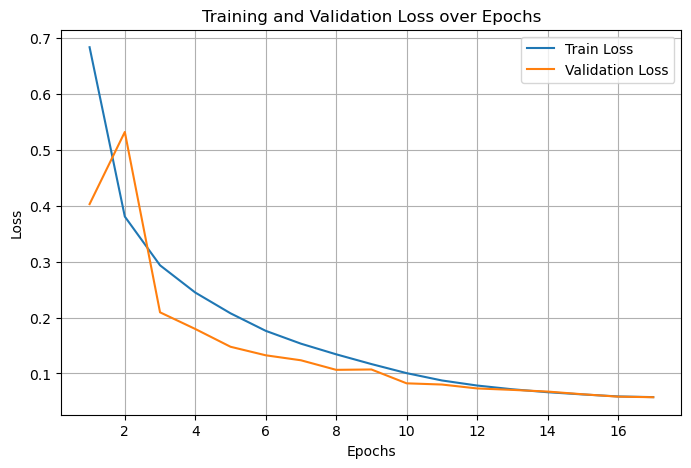

In [38]:
# Plot training and validation loss
epochs_range = range(1, len(train_loss_list) + 1)

plt.figure(figsize=(8, 5))
plt.plot(epochs_range, train_loss_list, label="Train Loss")
plt.plot(epochs_range, val_loss_list, label="Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training and Validation Loss over Epochs")
plt.legend()
plt.grid(True)
plt.show()

In [39]:
def compute_iou(preds, masks, threshold=0.5):
    """
    Compute IoU (Intersection over Union) for binary segmentation.

    Args:
    - preds: Model predictions (logits before activation)
    - masks: Ground truth masks
    - threshold: Binarization threshold (default 0.5)

    Returns:
    - IoU score
    """
    preds = torch.sigmoid(preds)  # Apply sigmoid to get probabilities
    preds = (preds > threshold).float()  # Convert to binary mask

    intersection = (preds * masks).sum(dim=(1, 2, 3))  # TP
    union = ((preds + masks) > 0).sum(dim=(1, 2, 3))  # TP + FP + FN

    iou = (intersection + 1e-6) / (union + 1e-6)  # Avoid division by zero
    return iou.mean().item()


# Evaluation loop
model.eval()
iou_scores = []

with torch.no_grad():
    for images, masks in val_loader:
        images, masks = images.to(device), masks.to(device)
        outputs = model(images)  # Get logits
        iou = compute_iou(outputs, masks)  # Compute IoU
        iou_scores.append(iou)

mean_iou = np.mean(iou_scores)
print(f"Mean IoU on validation set: {mean_iou:.4f}")

Mean IoU on validation set: 0.9821


In [41]:
torch.save(model.state_dict(), "../models/w3-based-model/unet-model.pth")

print("Saved model at ../models/w3-based-model/unet-model.pth")

Saved model at ../models/w3-based-model/unet-model.pth


In [42]:
from levee_hunter.utils import count_parameters

count_parameters(model)

24430097

In [47]:
def infer_and_visualize(model, image_tensor, mask_tensor, apply_sigmoid=True):

    if apply_sigmoid:
        with torch.no_grad():
            output = model(image_tensor.unsqueeze(0))
            output = torch.sigmoid(output).cpu().squeeze().numpy()
            output = (output > 0.5).astype(np.uint8)
    else:
        with torch.no_grad():
            output = model(image_tensor.unsqueeze(0))
            output = output.squeeze()
            output = np.array(output)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 3, 1)
    plt.title("Original Image")
    plt.imshow(image_tensor.squeeze())

    plt.subplot(1, 3, 2)
    plt.title("Prediction")
    plt.imshow(output, cmap=ListedColormap(["white", "black"]), vmin=0, vmax=1)

    plt.subplot(1, 3, 3)
    plt.title("Target Mask")
    plt.imshow(
        mask_tensor.squeeze(),
        cmap=ListedColormap(["white", "black"]),
        vmin=0,
        vmax=1,
    )

    plt.show()

    return output

0


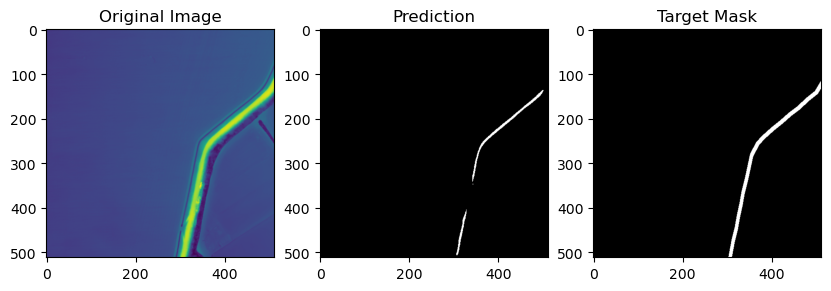

1


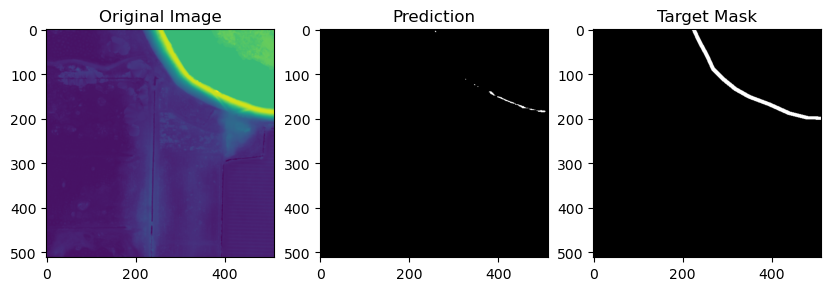

2


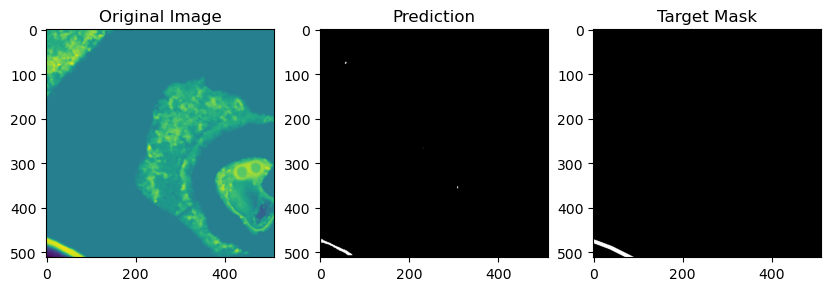

3


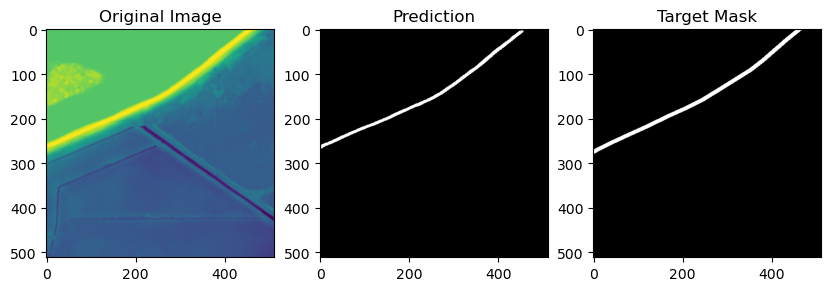

4


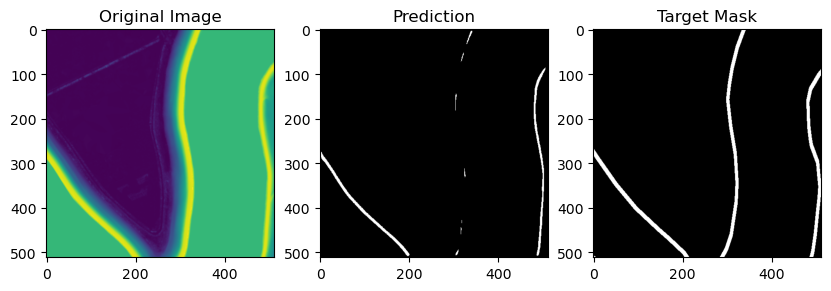

5


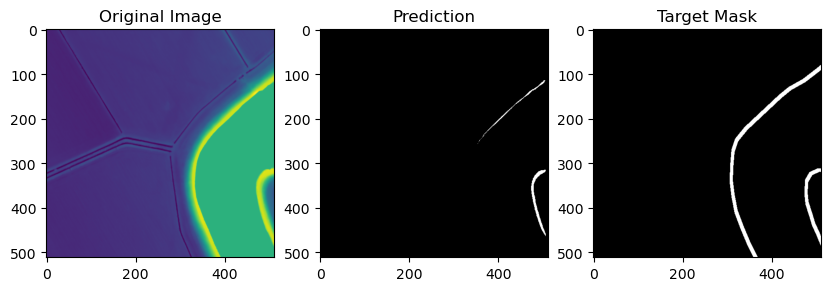

6


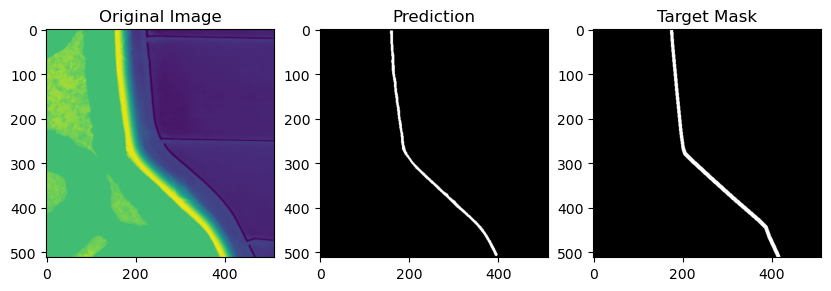

7


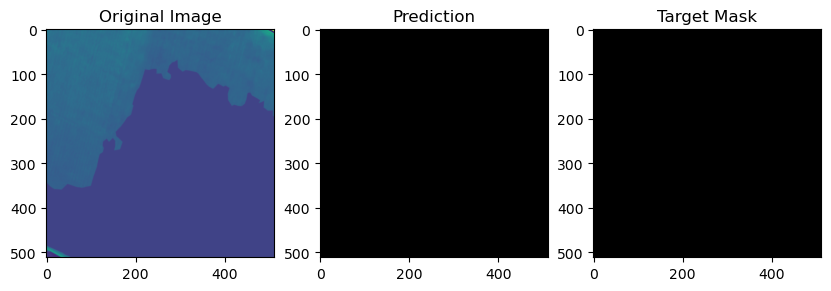

8


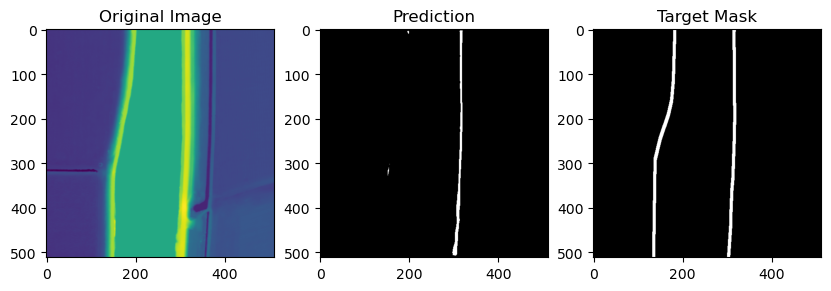

9


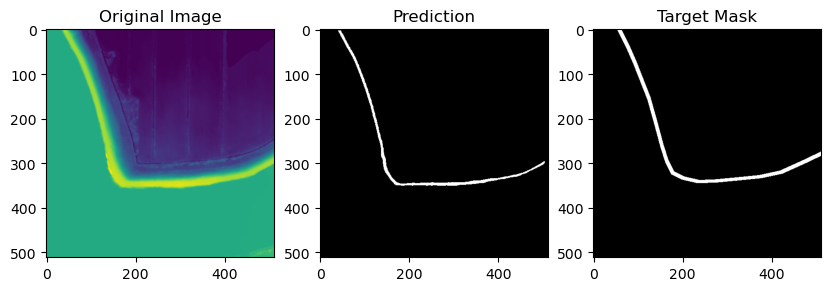

10


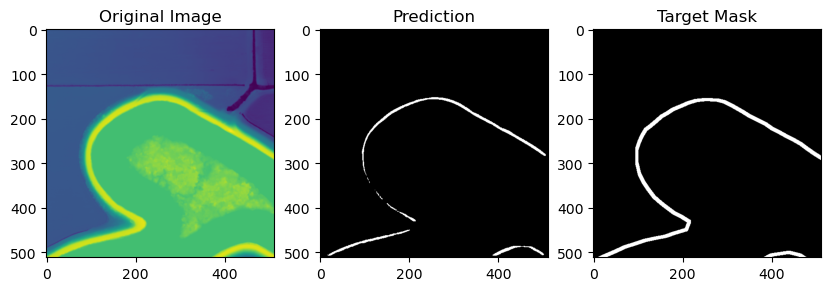

11


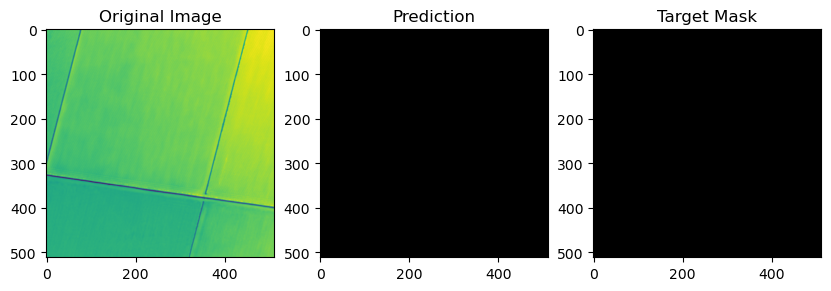

12


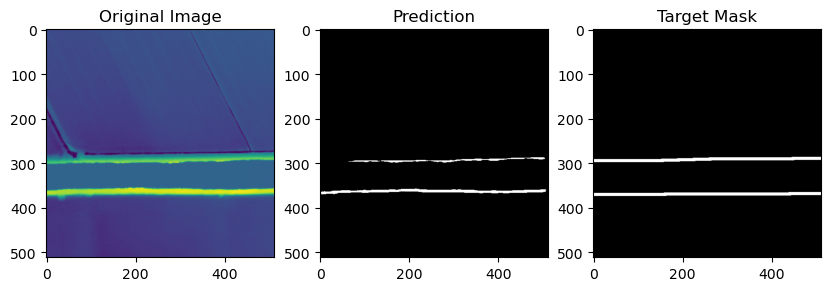

13


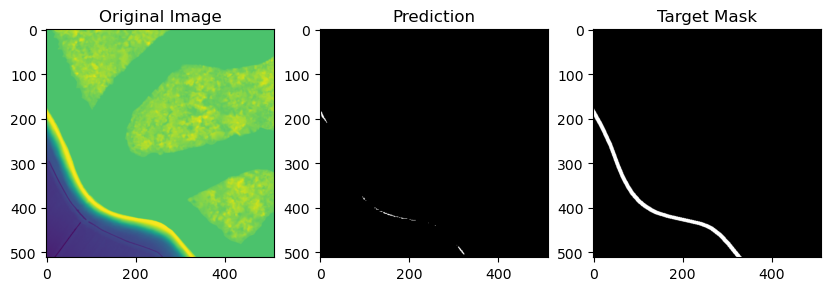

14


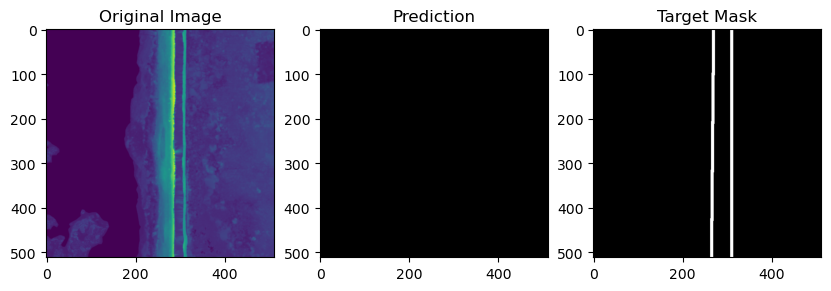

15


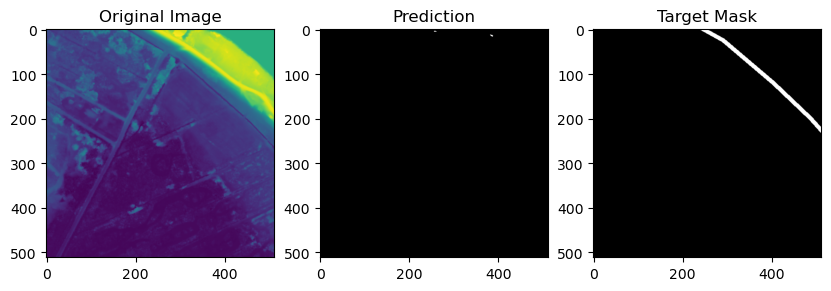

16


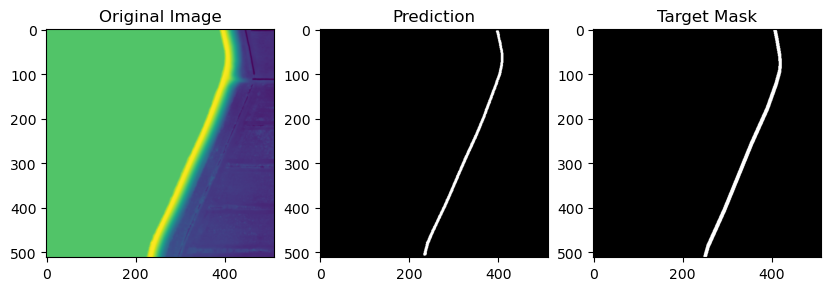

17


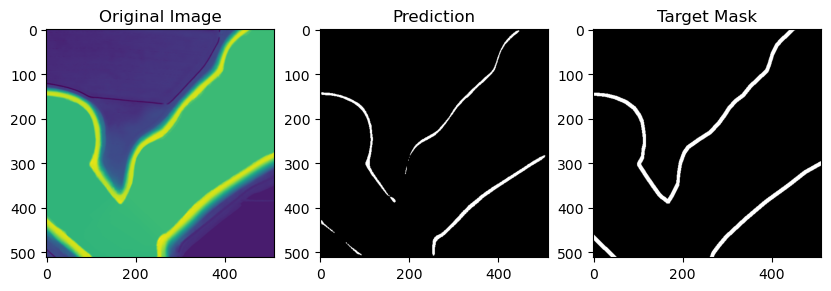

18


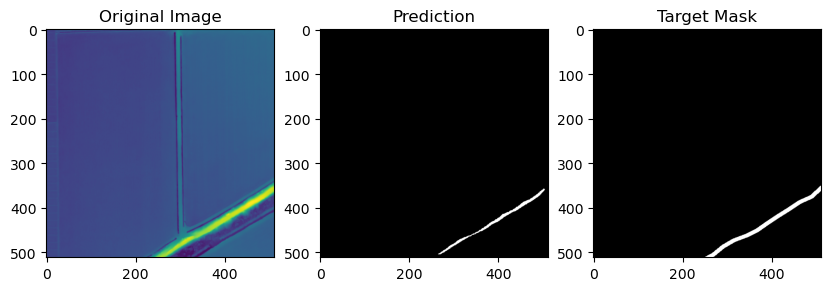

19


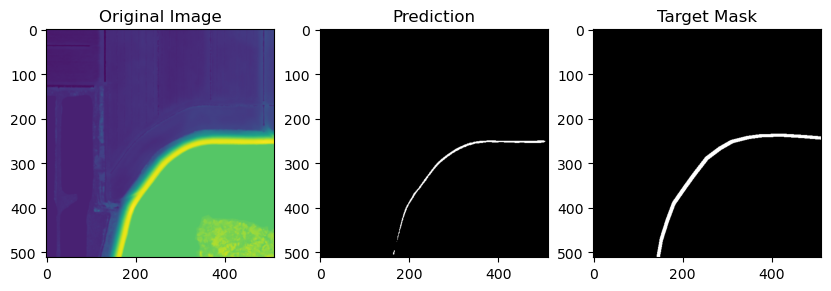

20


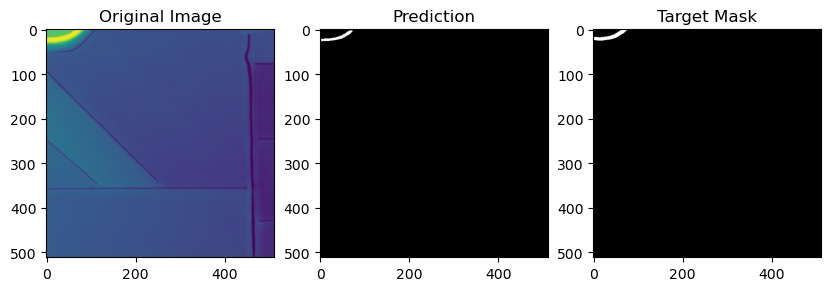

21


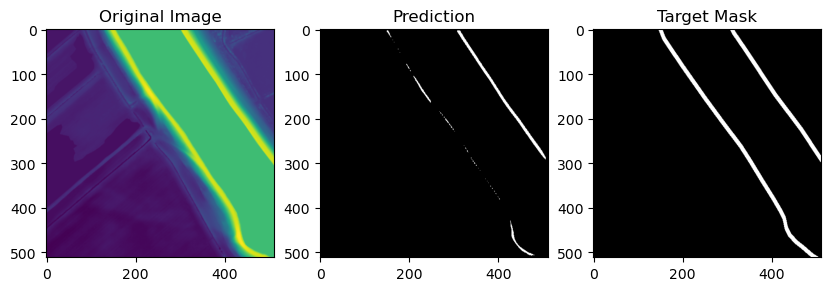

22


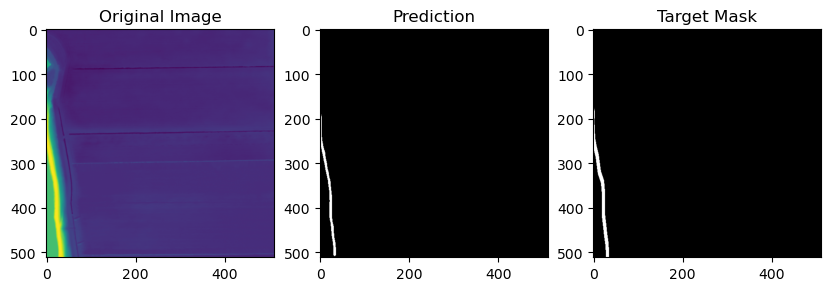

23


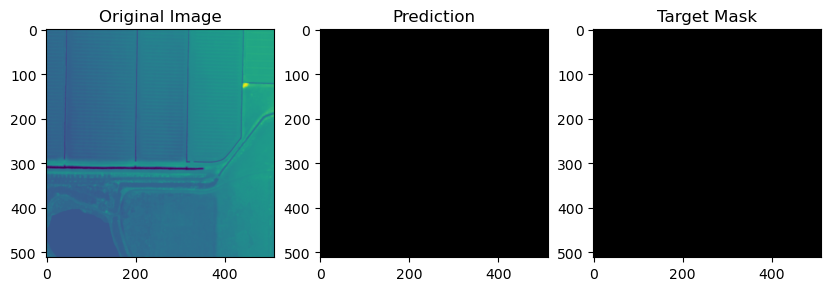

24


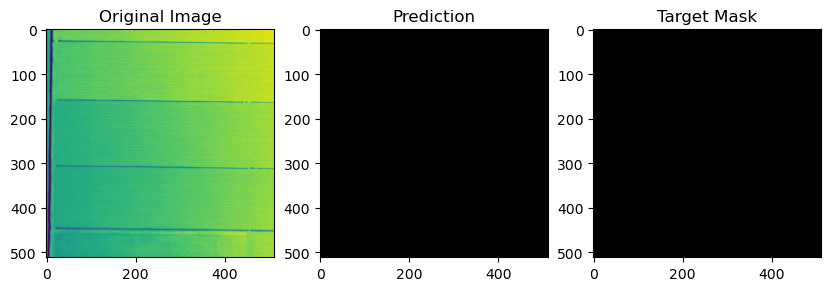

25


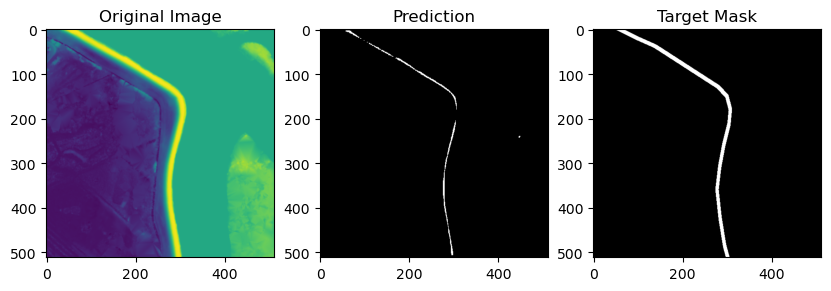

26


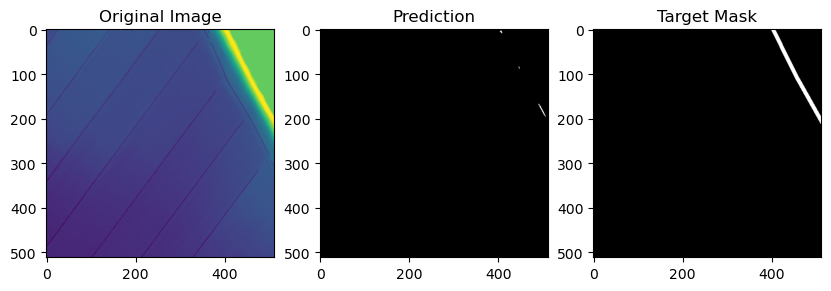

27


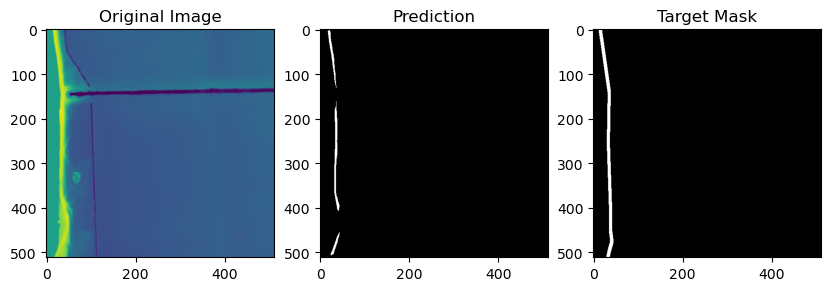

28


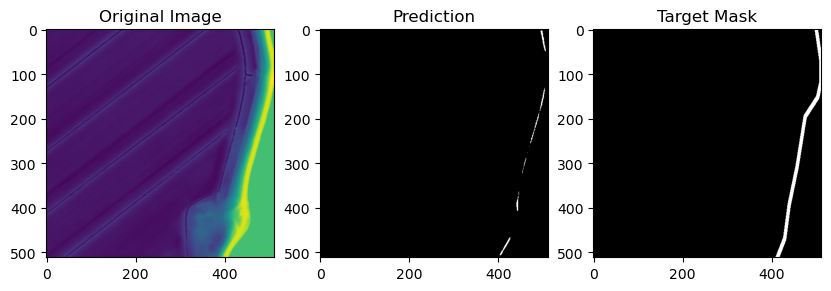

29


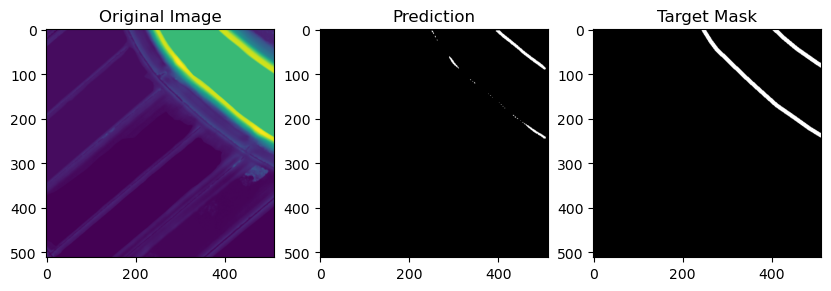

In [48]:
val_dataset.transform = normalize_only
for ix in range(30):
    sample_image, sample_mask = val_dataset[ix]
    # sample_image = sample_image.unsqueeze(0)
    print(ix)
    output = infer_and_visualize(model, sample_image, sample_mask, apply_sigmoid=True)